# Exploratory Data Analysis and Forecasting of Bath Air Quality Data from 2001 to 2014

**In this notebook we:**

- [x] Carry out an initial exploration of the data to assess the quality of the data
- [x] Clean and plot pollutant data to find relationships between pollutants
- [x] Seasonal decomposition of the Time Series data using _LOESS_ to find seasonality and trends
- [x] Fit _ARIMA_ models for forecasting
- [x] Fit _Prophet_ models for forecasting

In [18]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import autocorrelation_plot

%matplotlib inline
sns.set(color_codes=True)

In [19]:
import statsmodels.api as sm

In [84]:
s = 40
plt.rc('xtick', labelsize=s) 
plt.rc('ytick', labelsize=s) 

font = {'weight':'normal', 'size' : s, 'family': 'Dejavu sans'}
plt.rc('font', **font) 
params = {'axes.labelsize': s,
          'axes.titlesize': s}
plt.rcParams.update(params)

In [21]:
df = pd.read_csv('../data/BathHistoricalAirSensorData.csv')
df.shape

(111775, 11)

In [22]:
df.head()

,id,datetime,sensor_location_name,sensor_location_slug,sensor_location,nox,no,no2,co,pm10,o3
0,000028f9e7df56acb744d205b2807518,2006-09-16T22:00:00+00:00,Royal Victoria Park,royalvicpark,"{""latitude"":51.386538,""longitude"":-2.372476,""g...",NaN,NaN,NaN,NaN,NaN,7.5853
1,000042b563d6702d16d4757779809528,2011-10-27T00:00:00+00:00,Bath Guildhall,guildhall,"{""latitude"":51.382219,""longitude"":-2.359034,""g...",49.7,15.9,25.4,0.2,NaN,NaN
2,000080ec476fcbf25e7a38cc350eff67,2012-10-24T08:00:00+00:00,Bath Guildhall,guildhall,"{""latitude"":51.382219,""longitude"":-2.359034,""g...",300.8,145.1,79.0,0.5,NaN,NaN
3,00008666ffcbefe3cbe6ee3f0c0fa0eb,2013-05-13T11:00:00+00:00,Windsor Bridge,windsorbridge,"{""latitude"":51.382246,""longitude"":-2.381608,""g...",95.4,33.1,44.8,0.3,30.4,NaN
4,0000e565a2345eb4a95ed188f20478c4,2013-04-19T01:00:00+00:00,Royal Victoria Park,royalvicpark,"{""latitude"":51.386538,""longitude"":-2.372476,""g...",NaN,NaN,NaN,NaN,NaN,34.1972


In [23]:
df.reindex(range(len(df)))

,id,datetime,sensor_location_name,sensor_location_slug,sensor_location,nox,no,no2,co,pm10,o3
0,000028f9e7df56acb744d205b2807518,2006-09-16T22:00:00+00:00,Royal Victoria Park,royalvicpark,"{""latitude"":51.386538,""longitude"":-2.372476,""g...",NaN,NaN,NaN,NaN,NaN,7.5853
1,000042b563d6702d16d4757779809528,2011-10-27T00:00:00+00:00,Bath Guildhall,guildhall,"{""latitude"":51.382219,""longitude"":-2.359034,""g...",49.7,15.9,25.4,0.2,NaN,NaN
2,000080ec476fcbf25e7a38cc350eff67,2012-10-24T08:00:00+00:00,Bath Guildhall,guildhall,"{""latitude"":51.382219,""longitude"":-2.359034,""g...",300.8,145.1,79.0,0.5,NaN,NaN
3,00008666ffcbefe3cbe6ee3f0c0fa0eb,2013-05-13T11:00:00+00:00,Windsor Bridge,windsorbridge,"{""latitude"":51.382246,""longitude"":-2.381608,""g...",95.4,33.1,44.8,0.3,30.4,NaN
4,0000e565a2345eb4a95ed188f20478c4,2013-04-19T01:00:00+00:00,Royal Victoria Park,royalvicpark,"{""latitude"":51.386538,""longitude"":-2.372476,""g...",NaN,NaN,NaN,NaN,NaN,34.1972
...,...,...,...,...,...,...,...,...,...,...,...
111770,5bf9d1135ef2e163413455ac317a5e68,2006-09-22T05:00:00+00:00,Bath Guildhall,guildhall,"{""latitude"":51.382219,""longitude"":-2.359034,""g...",52.5,13.5,31.9,1.5,NaN,NaN
111771,5bfa2ad3585bd87ed176dafeb1de3201,2006-05-21T01:00:00+00:00,Royal Victoria Park,royalvicpark,"{""latitude"":51.386538,""longitude"":-2.372476,""g...",NaN,NaN,NaN,NaN,NaN,23.0320
111772,5bfa5381eba4d575f56011afdca66640,2013-05-13T00:00:00+00:00,Windsor Bridge,windsorbridge,"{""latitude"":51.382246,""longitude"":-2.381608,""g...",3.5,0.3,3.1,0.1,17.0,NaN
111773,5bfab091cd2c80361f76f97e52965be6,2011-10-14T05:00:00+00:00,Royal Victoria Park,royalvicpark,"{""latitude"":51.386538,""longitude"":-2.372476,""g...",NaN,NaN,NaN,NaN,NaN,12.4914


In [24]:
df.datetime.sort_values()

27205     2001-01-01T02:00:00+00:00
7090      2001-01-01T03:00:00+00:00
105674    2001-01-01T05:00:00+00:00
85440     2001-01-01T08:00:00+00:00
5171      2001-01-01T09:00:00+00:00
                    ...            
82873     2013-12-31T21:00:00+00:00
50741     2013-12-31T21:00:00+00:00
68802     2013-12-31T23:00:00+00:00
46380     2013-12-31T23:00:00+00:00
20420     2013-12-31T23:00:00+00:00
Name: datetime, Length: 111775, dtype: object

## **Initial Clean and Explore**

### Remove negative values

In [25]:
tmp = df._get_numeric_data()
tmp[tmp < 0] = 0

In [26]:
#Data format (object = str or mixed)
print('* Data Types *')
print(df.dtypes)

# drop irrelevant columns
print('\n*** dropping (probably) irrelevant columns such as id and sensor name')
df = df.drop(['sensor_location_name', 'id'], axis=1)

# rename columns
df = df.rename(columns={'nox'   : 'nitrogen_oxides (No2 + NO) ppb',
                        'no'    : 'nitrogen_monoxide (NO) ppb',
                        'no2'   : 'nitrogen_dioxide (No2) ppb',
                        'co'    : 'carbon_monoxide (CO) ppm',
                        'pm10'  : 'aerosol_particles (pm10) µg/m3',
                        'o3'    : 'ozone (o3) ppb'})


# Finding the null values.
print('\n* Exemplars / Rows *')
print(df.shape[0])

print('\n* Null Values *')
print(df.isnull().sum())

print('\n* Null Values % of data*')
print(df.isnull().sum() * 100 / len(df))

#remove all rows where nitrogen oxides data is missing
print('\n*** Removing all rows where nitrogen oxides data is missing so that we get 0 missing values (can also consider filling those NaNs with mean)')
df = df.dropna(subset=['nitrogen_oxides (No2 + NO) ppb'])

print('\n* Null Values % of data after cleanup *')
print(df.isna().sum() * 100 / len(df))

print('\n*** dropping column ozone (03) as its empty. It appears one of the sensors (royalvicpark) only collects ozone data so it is excluded as none of the other sensors collect this data.')
#drop the ozone column
df = df.drop(['ozone (o3) ppb'], axis=1)


* Data Types *
id                       object
datetime                 object
sensor_location_name     object
sensor_location_slug     object
sensor_location          object
nox                     float64
no                      float64
no2                     float64
co                      float64
pm10                    float64
o3                      float64
dtype: object

*** dropping (probably) irrelevant columns such as id and sensor name

* Exemplars / Rows *
111775

* Null Values *
datetime                              0
sensor_location_slug                  0
sensor_location                       0
nitrogen_oxides (No2 + NO) ppb    38219
nitrogen_monoxide (NO) ppb        38219
nitrogen_dioxide (No2) ppb        38219
carbon_monoxide (CO) ppm          50071
aerosol_particles (pm10) µg/m3    76898
ozone (o3) ppb                    73556
dtype: int64

* Null Values % of data*
datetime                           0.000000
sensor_location_slug               0.000000
sensor_location


* \/ Visualisations \/ *


<Figure size 432x288 with 0 Axes>

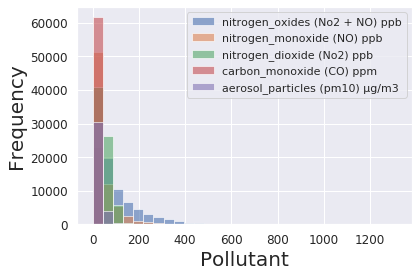

In [27]:
#Visualisation
print('\n* \/ Visualisations \/ *')

# plot all 
plt.figure()    
df.plot.hist(alpha=0.6, bins=30)
plt.ylabel("Frequency") 
plt.xlabel("Pollutant")    
plt.savefig('../graphs/All_Pollutants_Distribution.PNG')
plt.show()

In [28]:
def plot_normal_dist(df, col_name, x_label, suptitle, colour, xlim_r, save=True):
    
    
    plt.figure(figsize=[12,9])            

    # Plot histogram of pollutants
    sns.distplot(df[col_name], color=colour, label=col_name, bins='auto', hist_kws={'alpha': 0.4})           
    
    plt.legend()
    plt.ylabel('Frequency (norm)') 
    plt.xlabel(x_label)    
    plt.suptitle(suptitle)
    
    # Get mean and sd for title
    title = "\u03BC: {:.3f} | \u03C3: {:.3f}".format(np.mean(df[col_name]), np.std(df[col_name]))
    plt.title(title)
    
    # Set xlim to have correct zoom
    if xlim_r is not None: plt.xlim(right=xlim_r)
        
    # Maybe save
    if save: plt.savefig('../graphs/{}.png'.format(suptitle))
    
    plt.show()


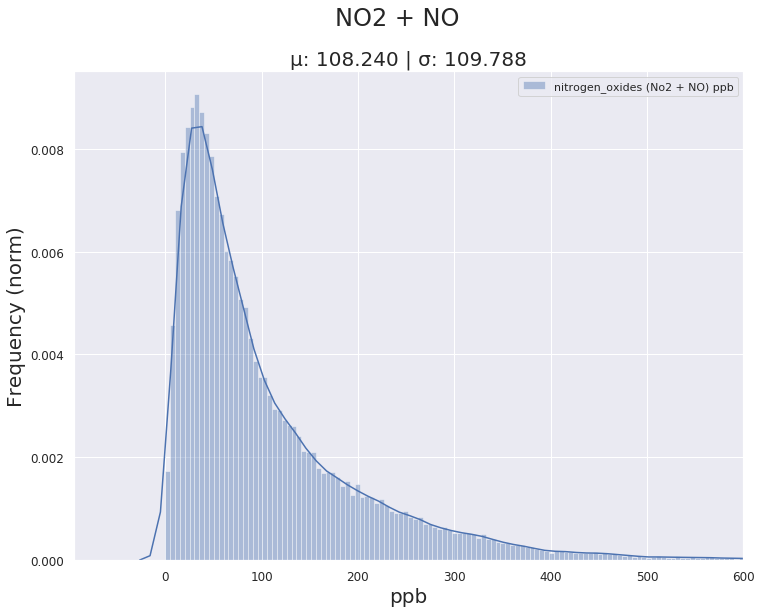

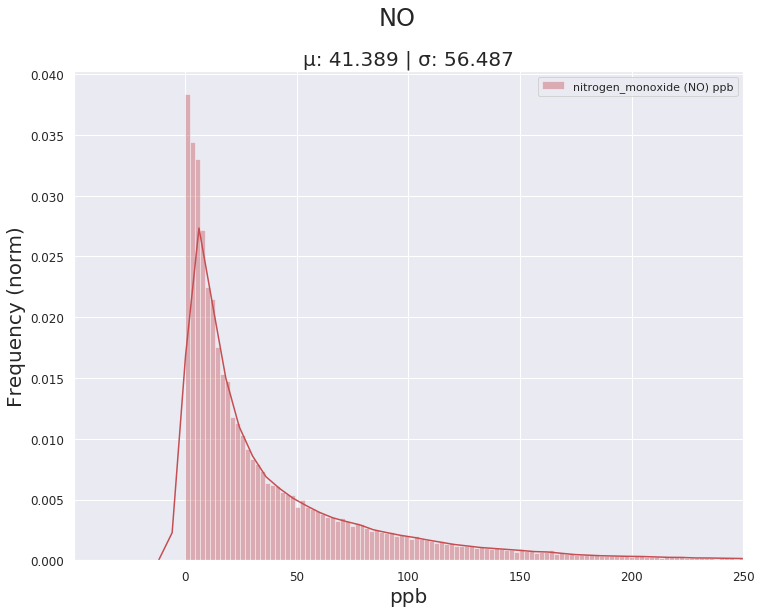

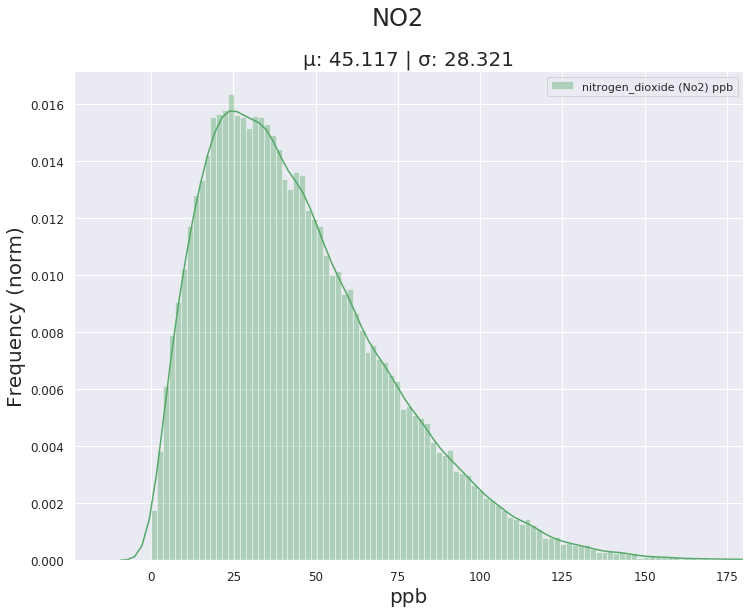

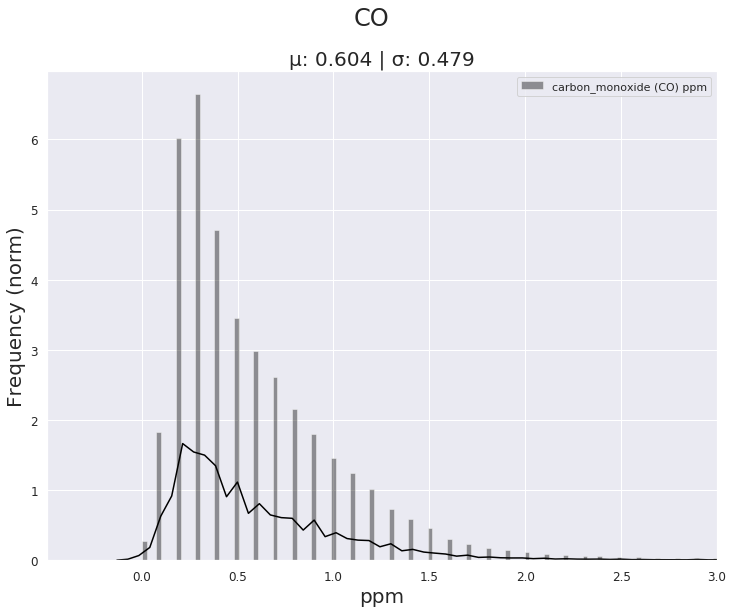

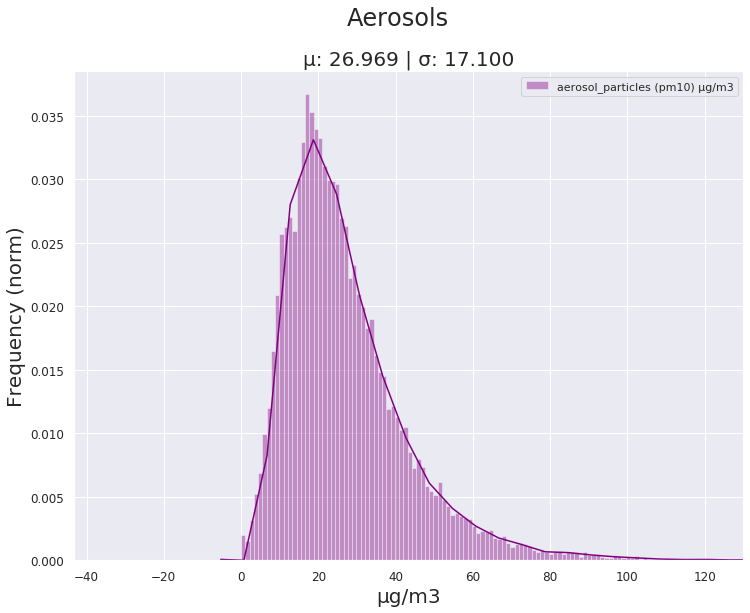

In [29]:
# Plot normal distribution for each pollutant

# Both NO2 and NO
plot_normal_dist(df, 'nitrogen_oxides (No2 + NO) ppb', 'ppb', xlim_r=600, suptitle='NO2 + NO', colour='b')

# NO
plot_normal_dist(df, 'nitrogen_monoxide (NO) ppb', 'ppb', suptitle='NO', colour='r', xlim_r=250)

# NO2
plot_normal_dist(df, 'nitrogen_dioxide (No2) ppb', 'ppb', suptitle='NO2', colour='g', xlim_r=180)

# CO
plot_normal_dist(df, 'carbon_monoxide (CO) ppm', 'ppm', suptitle='CO', colour='black', xlim_r=3)

# Aerosol
plot_normal_dist(df, 'aerosol_particles (pm10) µg/m3', 'µg/m3', suptitle='Aerosols', colour='purple', xlim_r=130)

## **Search for Correlations**


*** Heatmap shows data isnt very correlated, with exception of nitrogen oxides, and possibly No2 and pm10 slightly


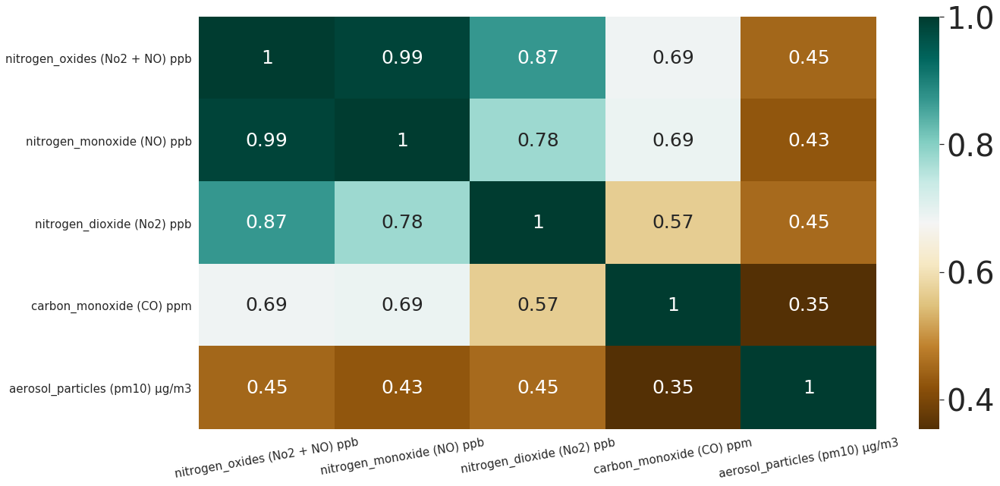

In [115]:
# Plot heatmap
plt.figure(figsize=(20,10))

g = sns.heatmap(df.corr(), cmap="BrBG", annot=True, annot_kws={"size": 25})

# Make it pretty
g.set_xticklabels(g.get_yticklabels(), rotation = 10, fontsize = 15)
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 15)

plt.savefig('../graphs/Pollutant_Correlation.png')
print('\n*** Heatmap shows data isnt very correlated, with exception of nitrogen oxides, and possibly No2 and pm10 slightly')



In [59]:
# Set index as time
df['datetime'] = pd.to_datetime(df.datetime)
# df['datetime'] = pd.to_datetime(df.datetime, unit='h')

df = df.set_index('datetime')
df = df.sort_index()

AttributeError: 'DataFrame' object has no attribute 'datetime'

In [39]:
print(df.isna().sum())


sensor_location_slug                  0
sensor_location                       0
nitrogen_oxides (No2 + NO) ppb        0
nitrogen_monoxide (NO) ppb            0
nitrogen_dioxide (No2) ppb            0
carbon_monoxide (CO) ppm          11852
aerosol_particles (pm10) µg/m3    38679
dtype: int64


In [40]:
print('The sensors with null values for Aerosol particles', df[df['aerosol_particles (pm10) µg/m3'].isna()].sensor_location_slug.unique())
print('The sensors with null values for CO particles', df[df['carbon_monoxide (CO) ppm'].isna()].sensor_location_slug.unique())


The sensors with null values for Aerosol particles ['guildhall']
The sensors with null values for CO particles ['londonrdaurn']


In [41]:
df_guild = df[df.sensor_location_slug=='guildhall']
df_ldn = df[df.sensor_location_slug=='londonrdaurn']

# Get non null data
prop_guild_aer = df_guild['aerosol_particles (pm10) µg/m3'].notna().sum()/len(df_guild) 
prop_ldn_co = df_ldn['carbon_monoxide (CO) ppm'].notna().sum()/len(df_ldn)

print('The proportion of Aerosol data points for the GuildHall sensor {}'.format(prop_guild_aer))
print('The proportion of CO data points for the London Rd sensor: {}'.format(prop_ldn_co))

The proportion of Aerosol data points for the GuildHall sensor 0.0
The proportion of CO data points for the London Rd sensor: 0.0


**_It would seem that some sensors don't collect values for some pollutants! The only way to deal with this is to split by pollutant and remove corresponding missing sensor or split by sensor and remoce corresponding missing pollutant_**

**_In our prototype we have to ensure that every sensor measures all of the pollutants and they all are synced to measure them at the same time for the best results._**

**1) We have to get rid of the null values  - Interpolation Imputation**

In [42]:
pollutants = ['nitrogen_monoxide (NO) ppb',
              'nitrogen_dioxide (No2) ppb',
             'carbon_monoxide (CO) ppm',
             'aerosol_particles (pm10) µg/m3']
df_interp = df.copy()
for p in pollutants:
    if df_interp[p].isna().sum() > 0:
        df_interp[p].interpolate(method='time', inplace=True)

In [43]:
print('Let\'s check to see all of the null values have gone \n')
print(df_interp.isna().sum()/len(df_interp), '\n')
print("There still seems to be some null values for the Aerosol particulates - why?")

Let's check to see all of the null values have gone 

sensor_location_slug              0.000000
sensor_location                   0.000000
nitrogen_oxides (No2 + NO) ppb    0.000000
nitrogen_monoxide (NO) ppb        0.000000
nitrogen_dioxide (No2) ppb        0.000000
carbon_monoxide (CO) ppm          0.000000
aerosol_particles (pm10) µg/m3    0.131329
dtype: float64 

There still seems to be some null values for the Aerosol particulates - why?


### **Stationarity**

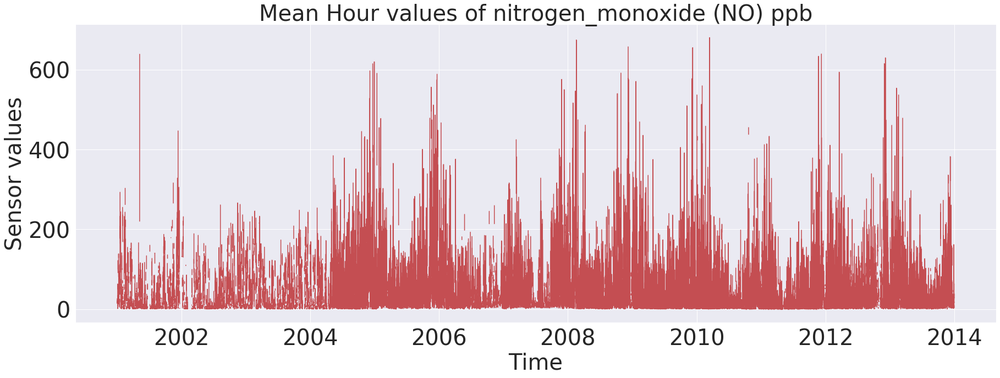

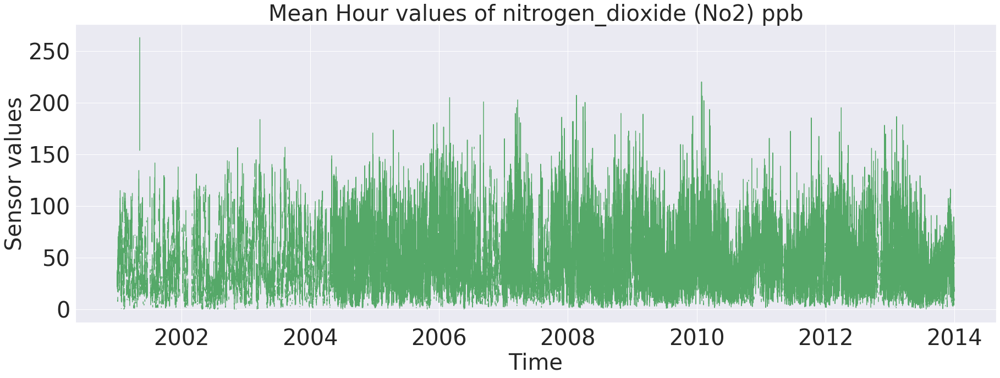

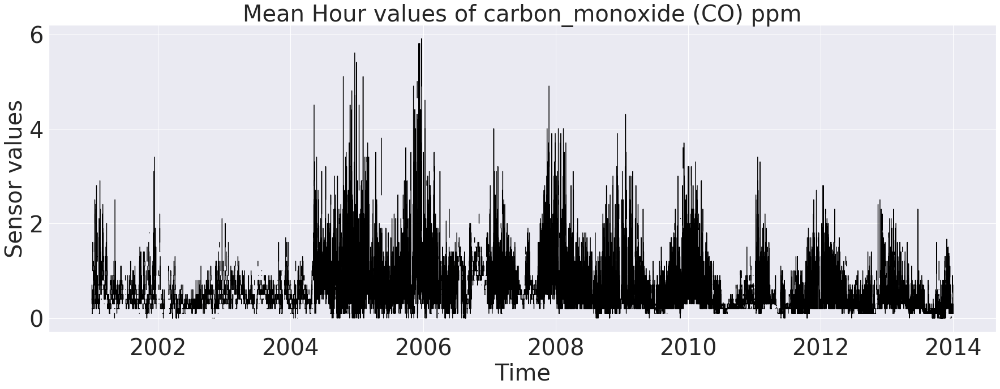

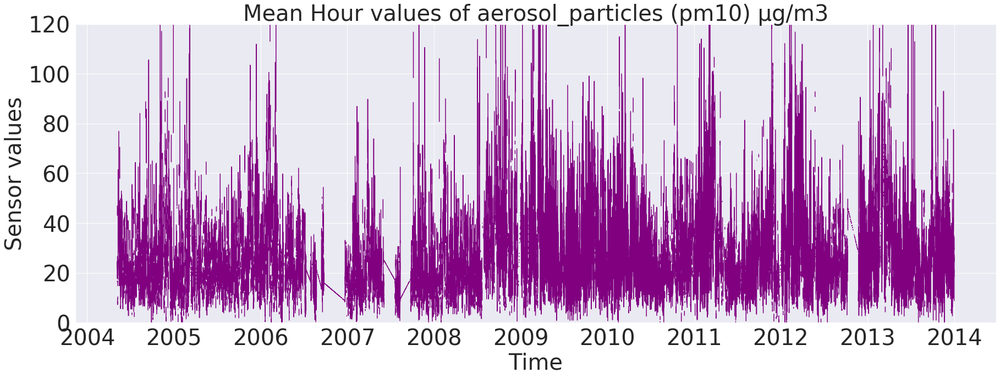

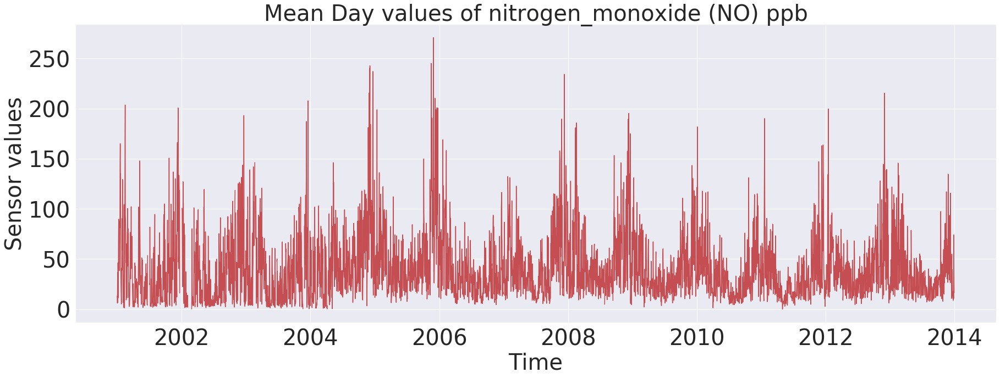

...

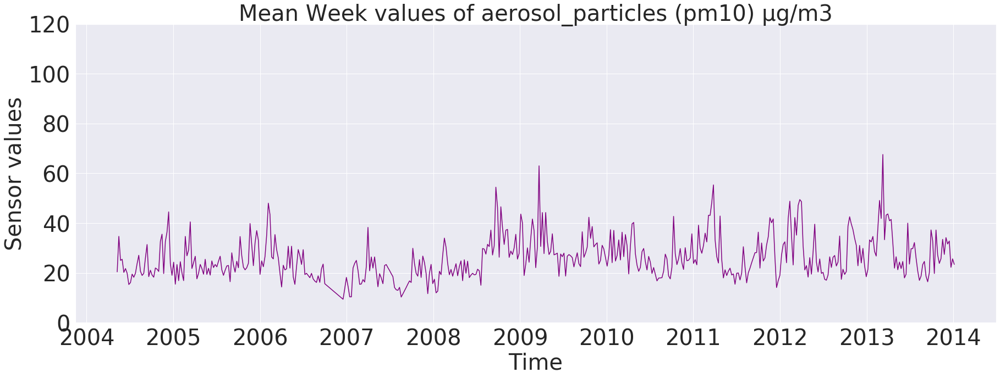

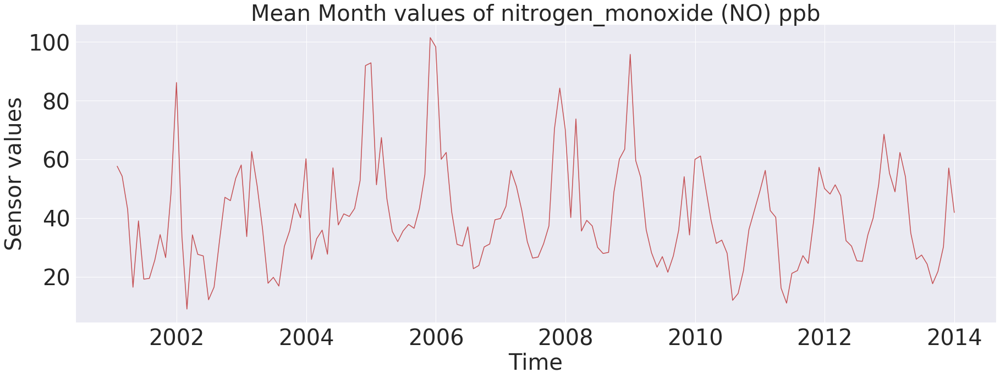

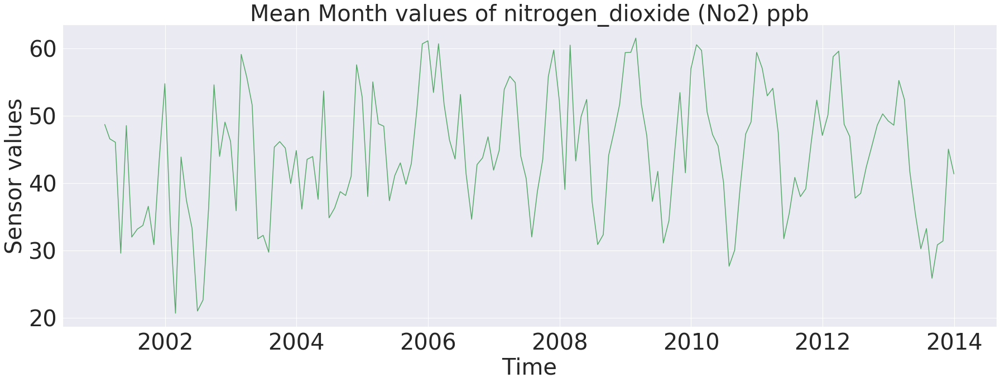

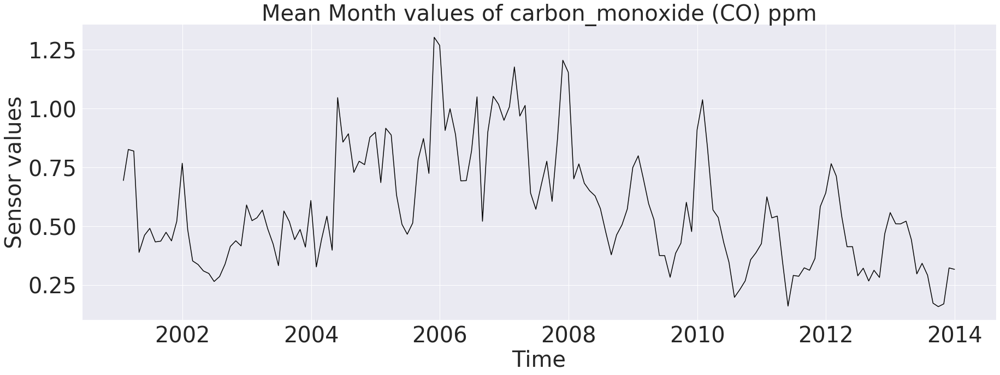

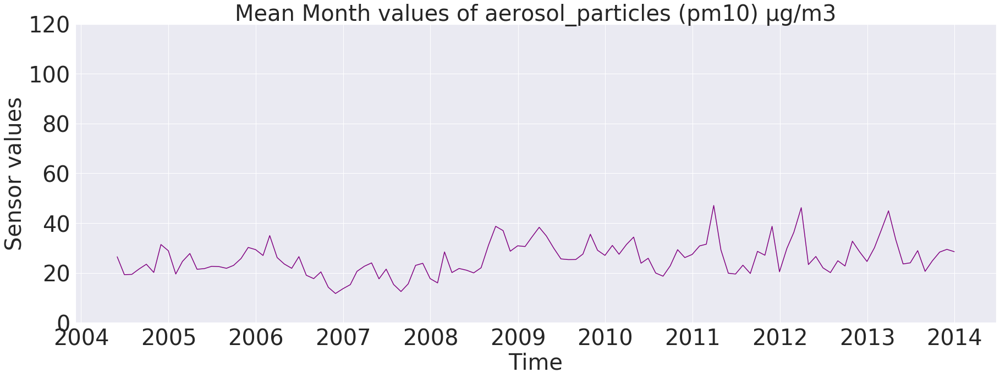

In [85]:
# Plot the average of each time slot day, week, month, 3 month, year
pollutants = ['nitrogen_monoxide (NO) ppb', 'nitrogen_dioxide (No2) ppb', 
              'carbon_monoxide (CO) ppm', 'aerosol_particles (pm10) µg/m3']
periods = ['H', 'D', 'W', 'M']
colours = ['r', 'g', 'black', 'purple']
period_titles = ['Hour', 'Day', 'Week', 'Month']


for i, period in enumerate(periods):
    for j, p in enumerate(pollutants):
        plt.figure(figsize=(30, 10))
        plt.title('Mean {} values of {}'.format(period_titles[i], p))
        plt.plot(df_interp[p].resample(period).mean(), c=colours[j])
        plt.xlabel('Time')
        if j==3: plt.ylim(bottom=0, top=120)
        plt.ylabel('Sensor values')
        plt.savefig('../graphs/resampling_plots_{}_over_{}.PNG'.format(p.split()[0], period))
        plt.show()

**Hourly**
Graphs are too dense

**Daily**
Still too dense but there is some periodicity happening

**Weekly**
Periodic and no real trends

**Monthly**
Periodic and no real trends



In [66]:
def plot_stationarity(df, col_name, sensor=None, span_size=24, save=True, colour='b', show=True):
    
    # Label graph per timespan
    times = {1: 'Hour', 24:'Day', 168:'Week', 720:'Month', 2160:'3 months', 8760:'Year'}
    
    # For when we split the data by sensor
    if sensor is not None: 

        # Get data for sensor
        df2 = df[df.sensor_location_slug==sensor]
        
        # Get data for pollutant
        df2 = df2[col_name]
        
        # If the sensor-pollutant combo has no data then print this and stop
        if df2.isna().sum() == len(df2):
            print("There is no data from sensor at {} for {}".format(sensor.capitalize(), col_name.capitalize()))
            return
        else:
            plt.figure(figsize=(30, 10))
            # Set a title to show what sensor it it
            plt.title('Sensor: {}, Moving Average Span: {}'.format(sensor.capitalize(), times[span_size]))
            df2 = df2.dropna()
    else:
        # Get data for pollutant
        df2 = df[col_name]
        
        # Drop null data
        df2 = df2.dropna()
    
        plt.figure(figsize=(30, 10))
        plt.title('Moving Average Span: {}'.format(times[span_size]))

    # Plot scatter of pollutants over time
    plt.plot_date(df2.index, df2.ewm(span = span_size).mean(), c=colour)
    
    
    # Make it pretty
    plt.xlabel('Date')
    plt.ylabel(col_name)
    
    
    # Maybe save the plot
    if save: 
        if sensor is None: 
            plt.savefig('../graphs/{}_span{}stationarity.png'.format(col_name.split()[0], times[span]))
        else:
            plt.savefig('../graphs/{}_{}_{}stationarity.png'.format(sensor.split()[0], col_name.split()[0], times[span]))
    if show: plt.show()


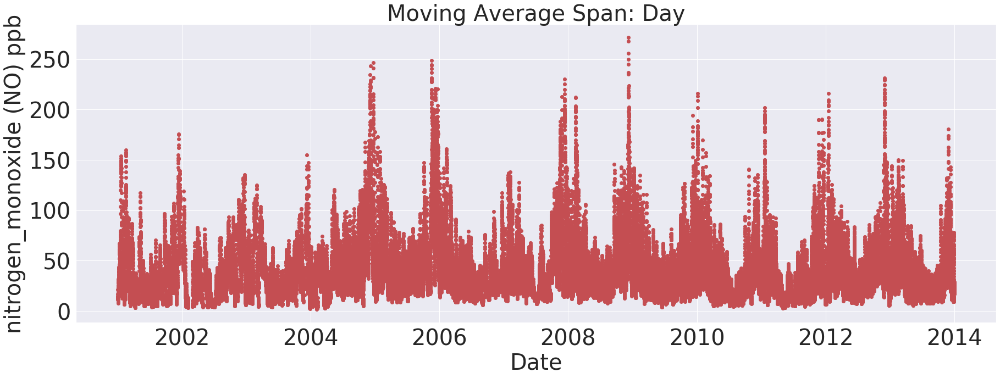

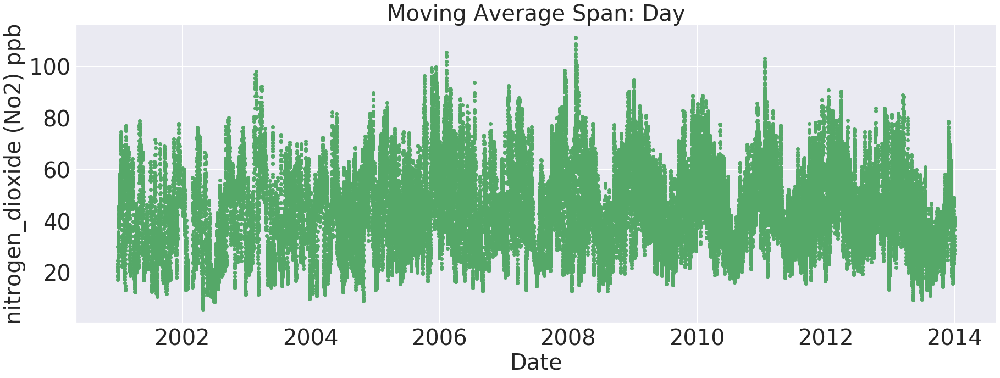

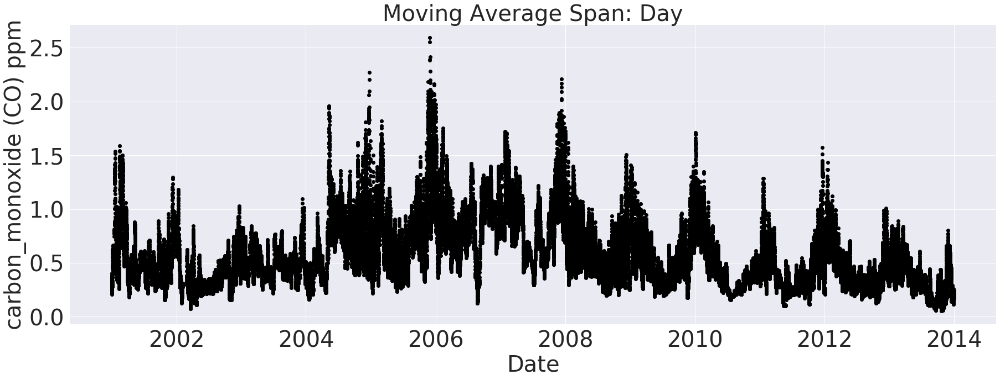

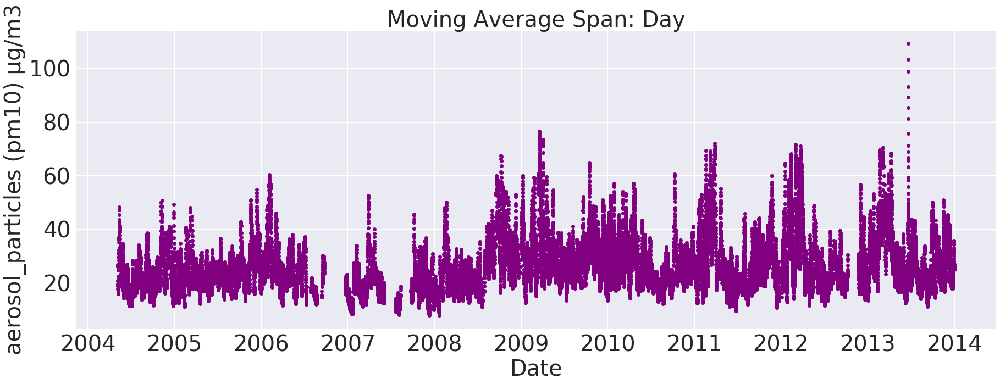

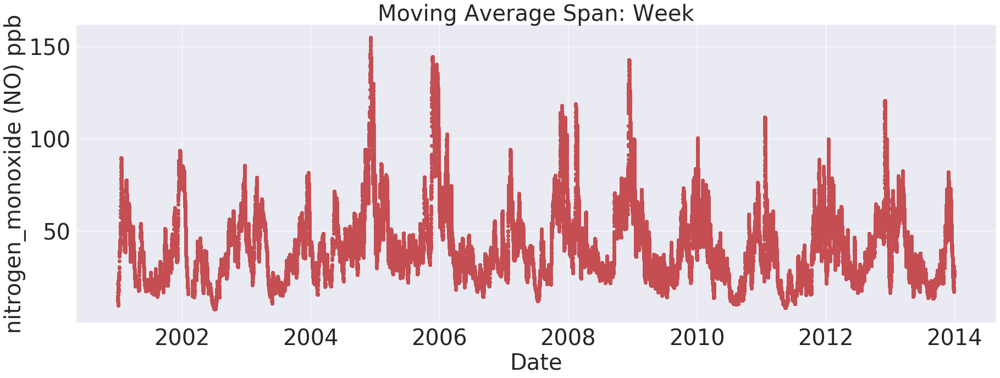

...

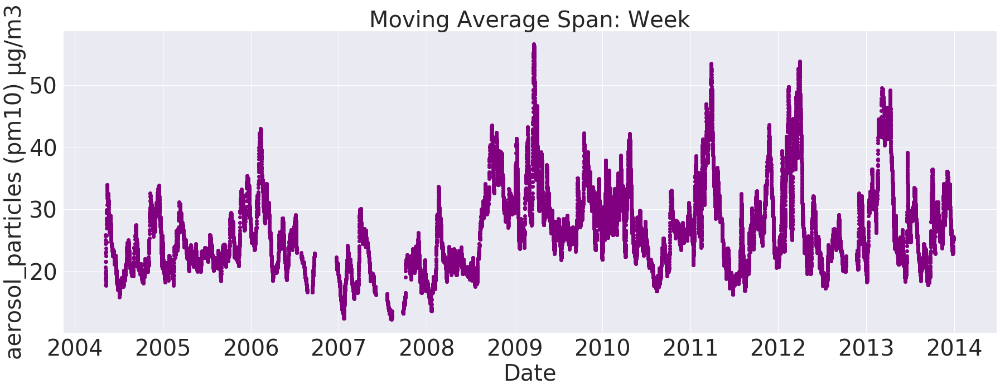

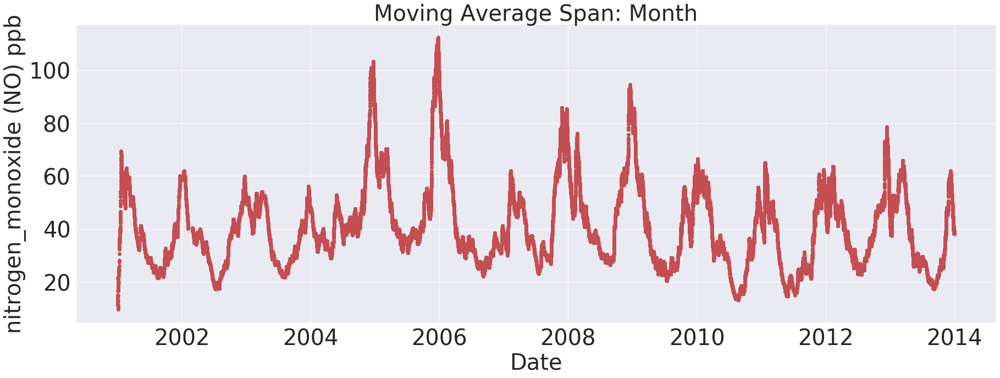

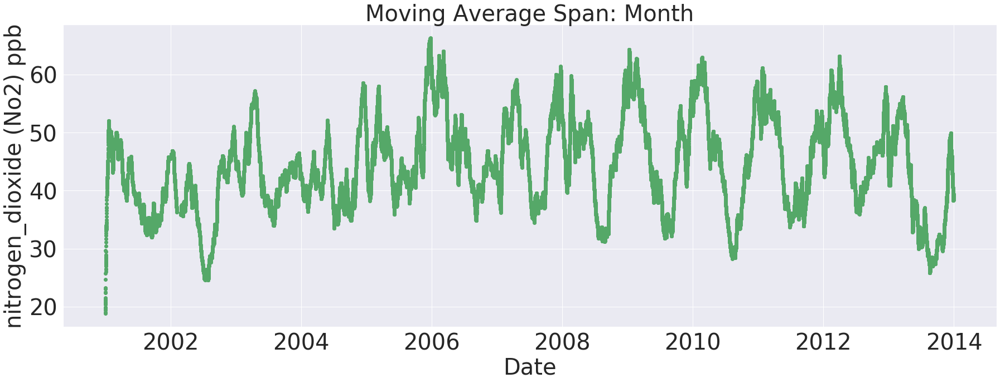

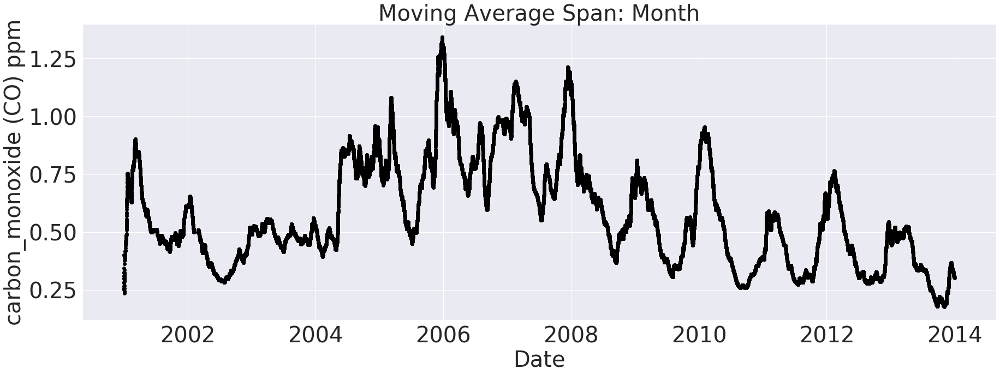

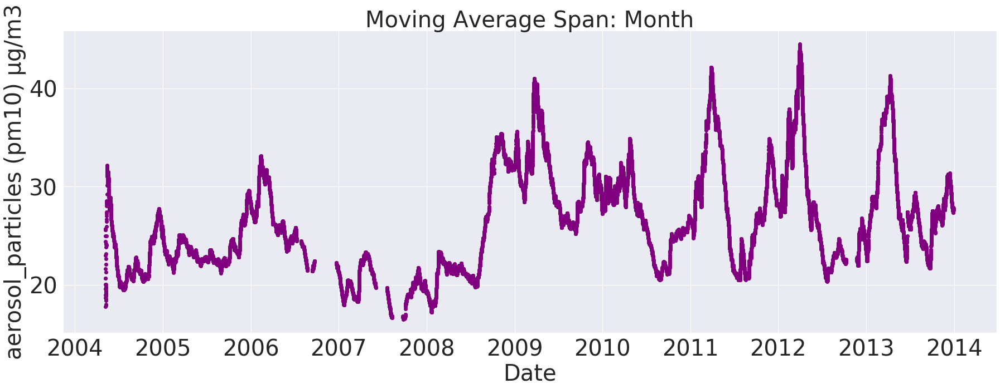

In [86]:
# Plot moving average 
spans = [24, 7*24, 30*24] # day, week, month
for span in spans:
    for i, p in enumerate(pollutants):
        plot_stationarity(df, p, colour=colours[i], span_size=span)

Periodic in all cases, however, hourly and daily graphs are quite dense 



**_Try plotting it at each sensor location_**

In [81]:
print(" \/ Proportion of data points by sensor location \/")

sensors = ['guildhall', 'windsorbridge', 'londonrdaurn']
for sensor in sensors:
    print('\t {}: {:.1f}'.format(sensor, 100*len(df[df.sensor_location_slug==sensor])/len(df)))


 \/ Proportion of data points by sensor location \/
	 guildhall: 52.6
	 windsorbridge: 31.3
	 londonrdaurn: 16.1


In [82]:
print(" \/ Number of data points by sensor location and pollutant of original data \/")

for sensor in sensors:
    df2 = df[df.sensor_location_slug==sensor]
    for p in pollutants:
        # Get proportion of not null data
        len_df2 = df2[p].notna().sum() / len(df)
        
        print('\t {} and {}: {:.1f}%'.format(sensor.capitalize(), p.capitalize(),  100*len_df2))


 \/ Number of data points by sensor location and pollutant of original data \/
	 Guildhall and Nitrogen_monoxide (no) ppb: 52.6%
	 Guildhall and Nitrogen_dioxide (no2) ppb: 52.6%
	 Guildhall and Carbon_monoxide (co) ppm: 52.6%
	 Guildhall and Aerosol_particles (pm10) µg/m3: 0.0%
	 Windsorbridge and Nitrogen_monoxide (no) ppb: 31.3%
	 Windsorbridge and Nitrogen_dioxide (no2) ppb: 31.3%
	 Windsorbridge and Carbon_monoxide (co) ppm: 31.3%
	 Windsorbridge and Aerosol_particles (pm10) µg/m3: 31.3%
	 Londonrdaurn and Nitrogen_monoxide (no) ppb: 16.1%
	 Londonrdaurn and Nitrogen_dioxide (no2) ppb: 16.1%
	 Londonrdaurn and Carbon_monoxide (co) ppm: 0.0%
	 Londonrdaurn and Aerosol_particles (pm10) µg/m3: 16.1%


############## guildhall #####################
############## nitrogen_monoxide (NO) ppb #####################


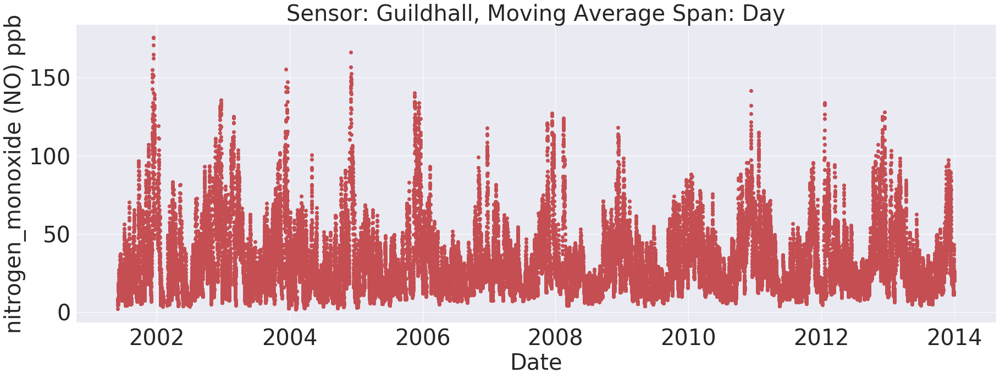

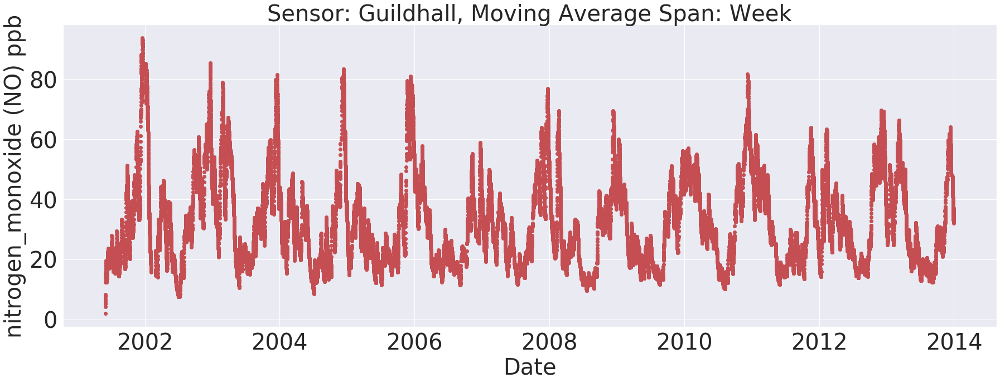

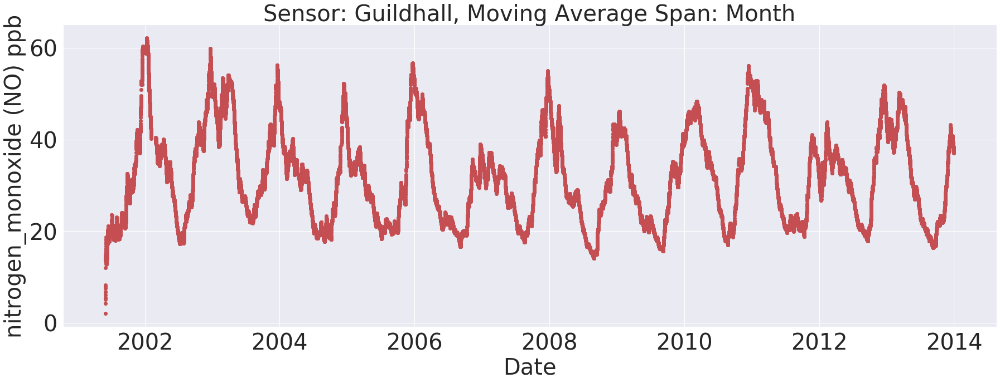

############## nitrogen_dioxide (No2) ppb #####################


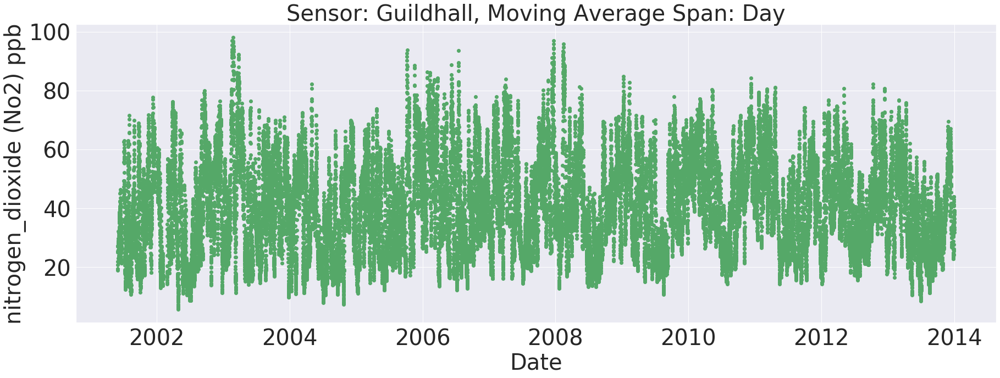

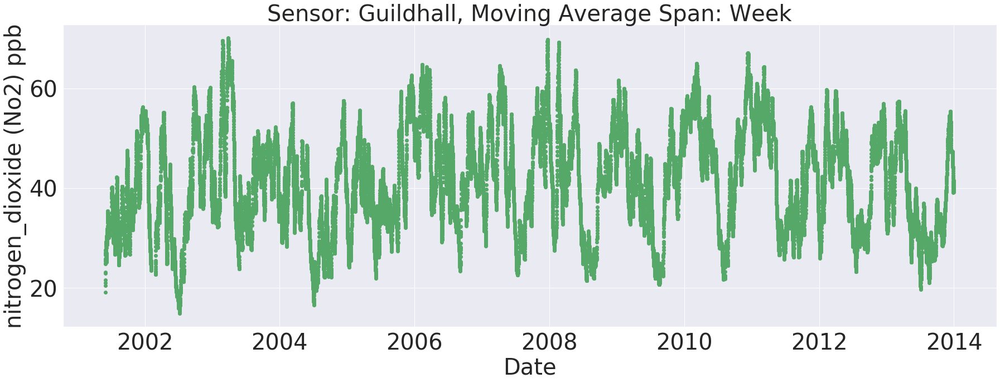

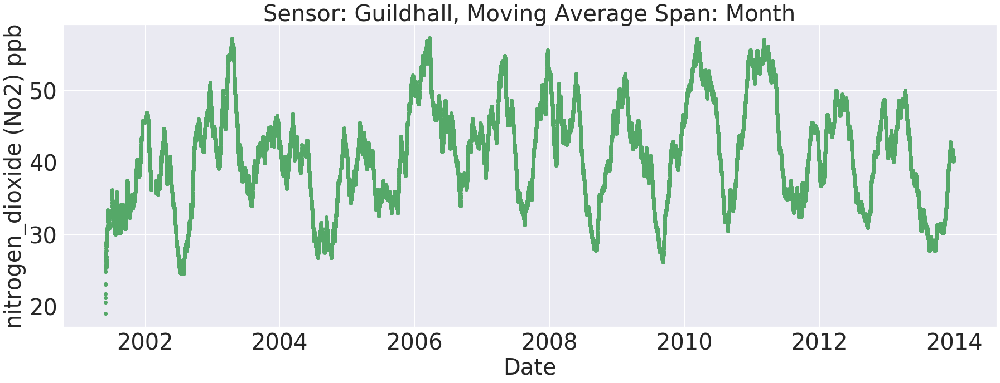

############## carbon_monoxide (CO) ppm #####################


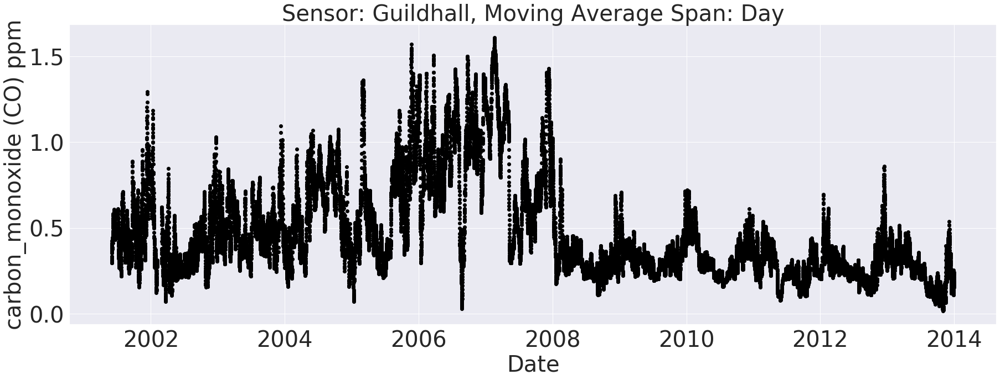

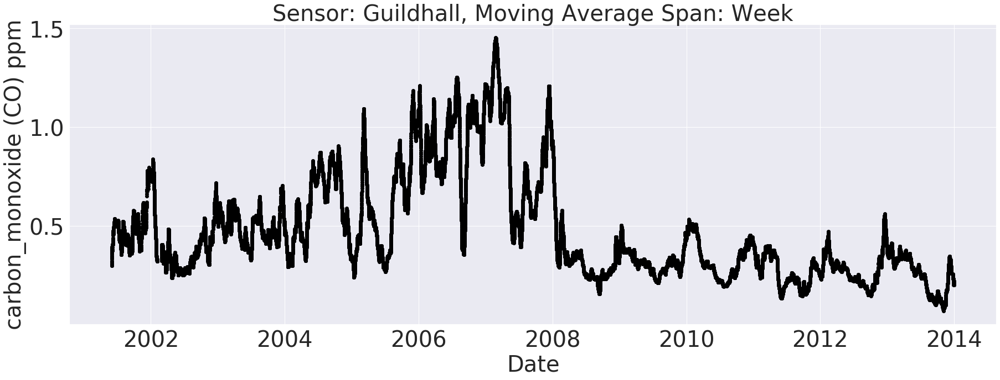

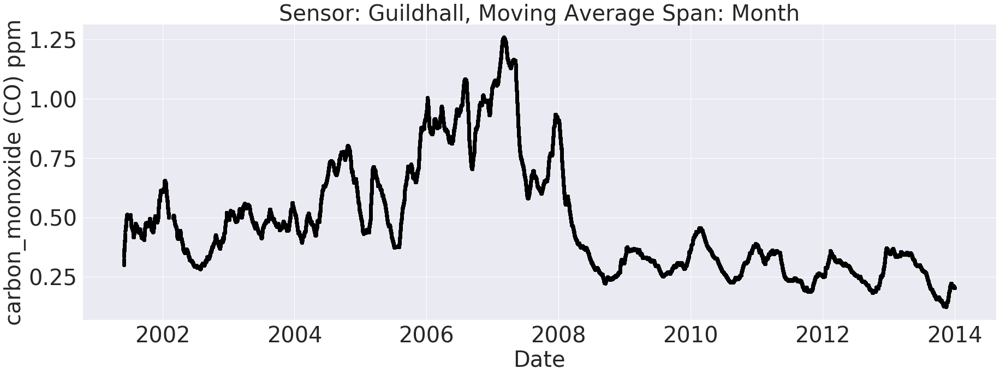

############## aerosol_particles (pm10) µg/m3 #####################
There is no data from sensor at Guildhall for Aerosol_particles (pm10) µg/m3
There is no data from sensor at Guildhall for Aerosol_particles (pm10) µg/m3
There is no data from sensor at Guildhall for Aerosol_particles (pm10) µg/m3
############## windsorbridge #####################
############## nitrogen_monoxide (NO) ppb #####################


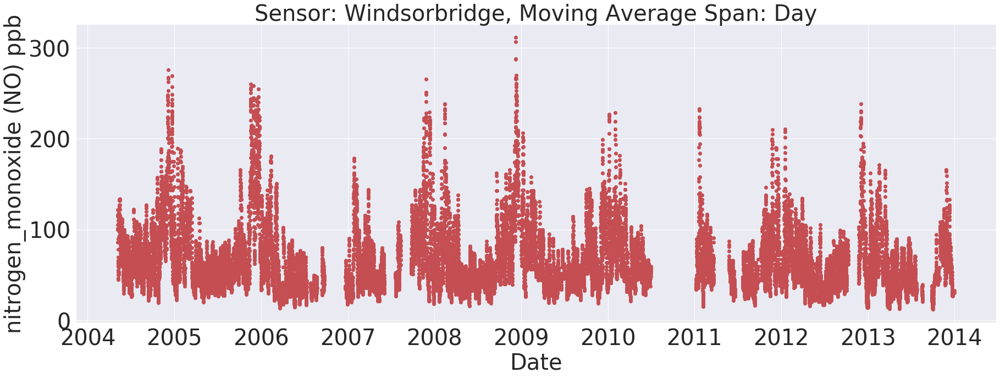

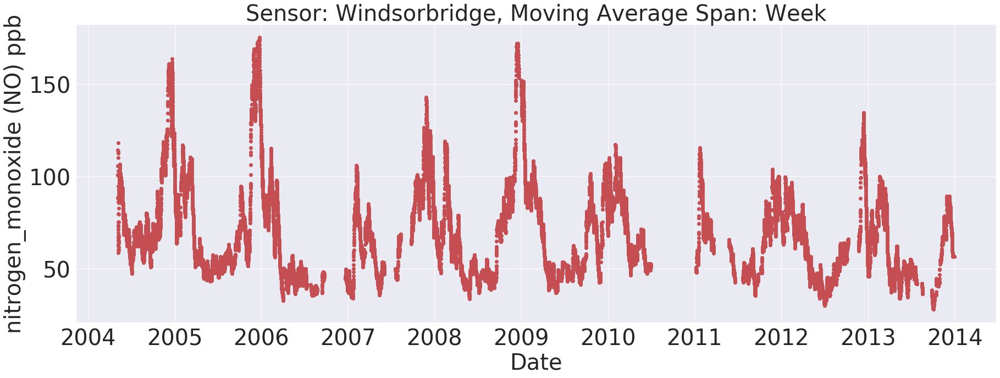

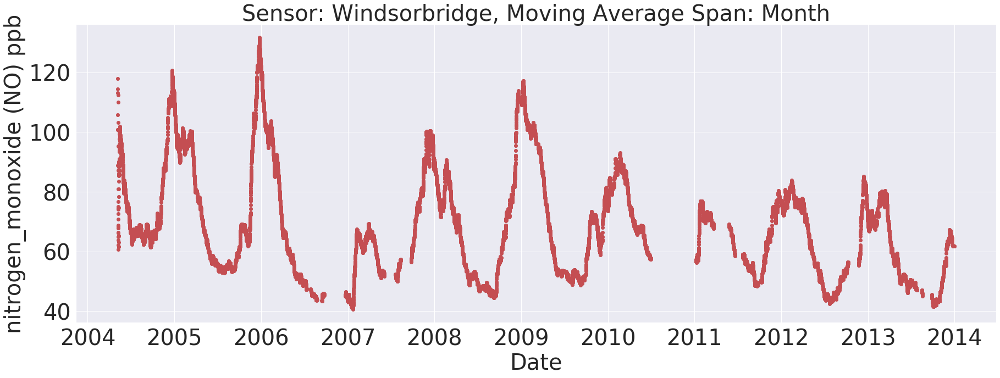

############## nitrogen_dioxide (No2) ppb #####################


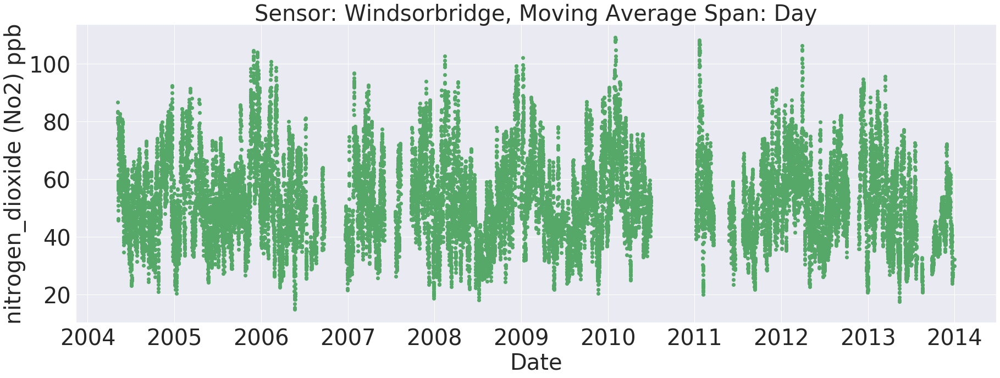

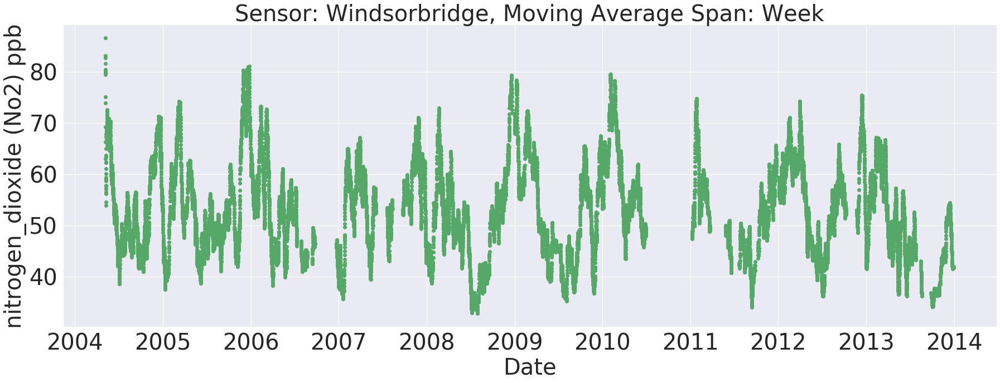

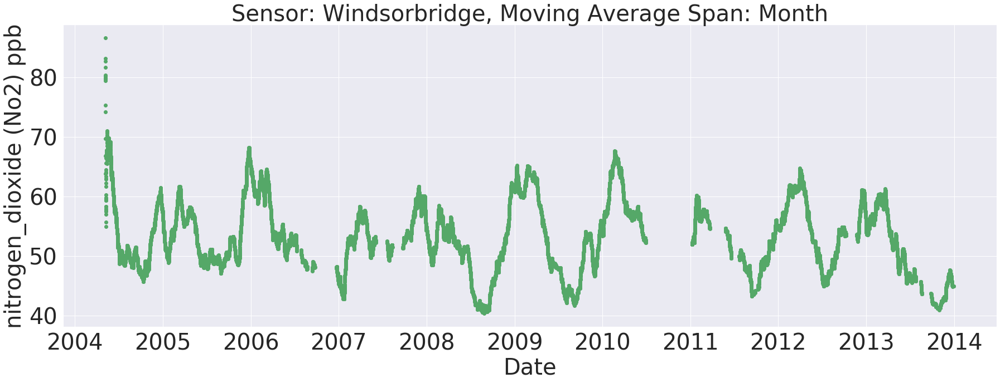

############## carbon_monoxide (CO) ppm #####################


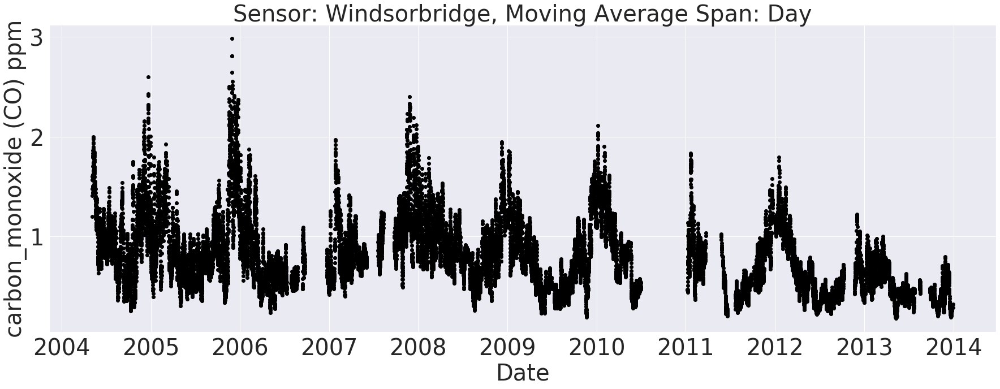

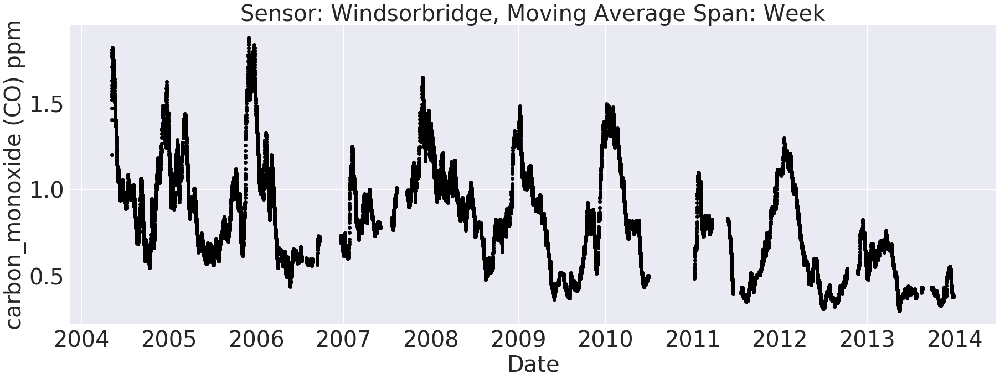

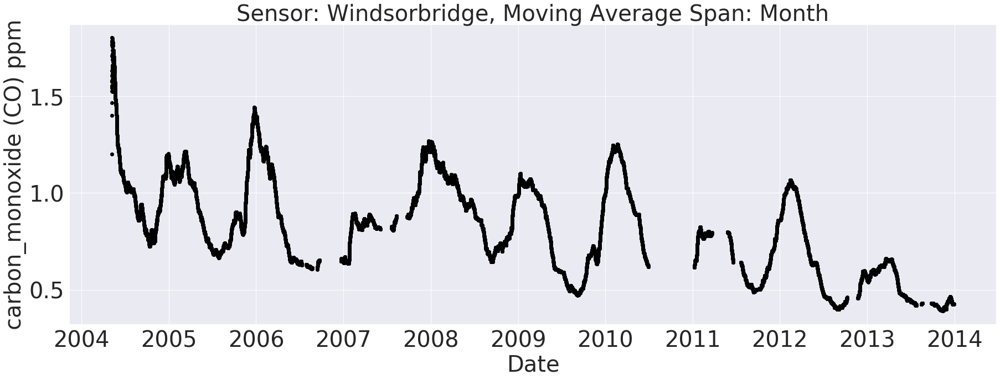

############## aerosol_particles (pm10) µg/m3 #####################


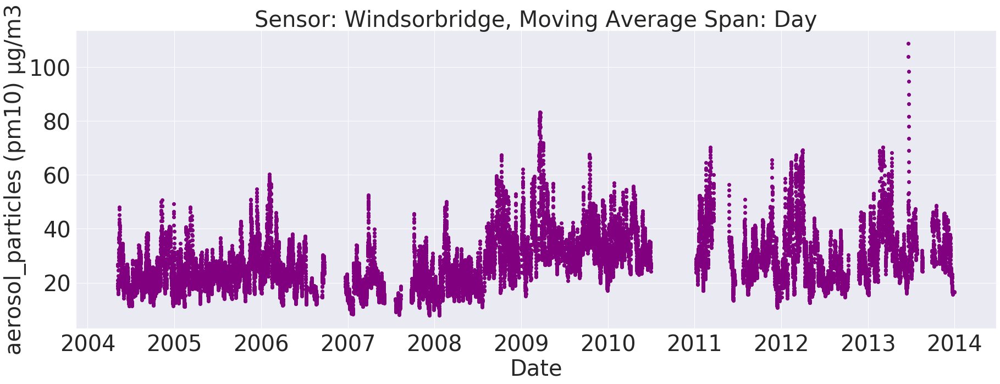

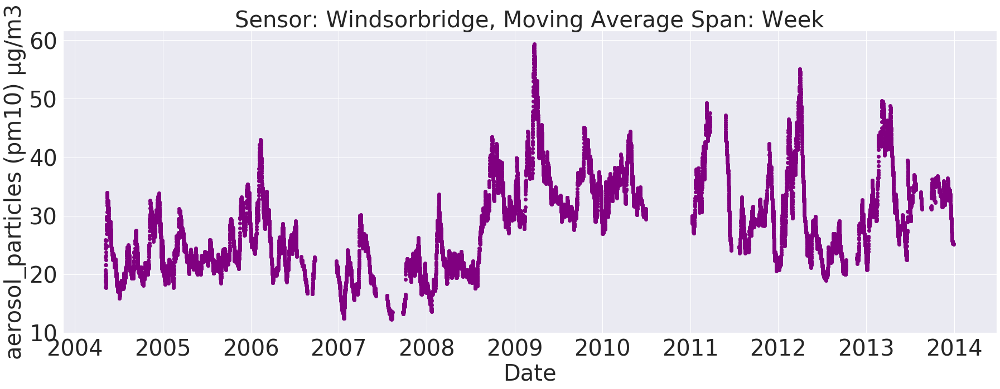

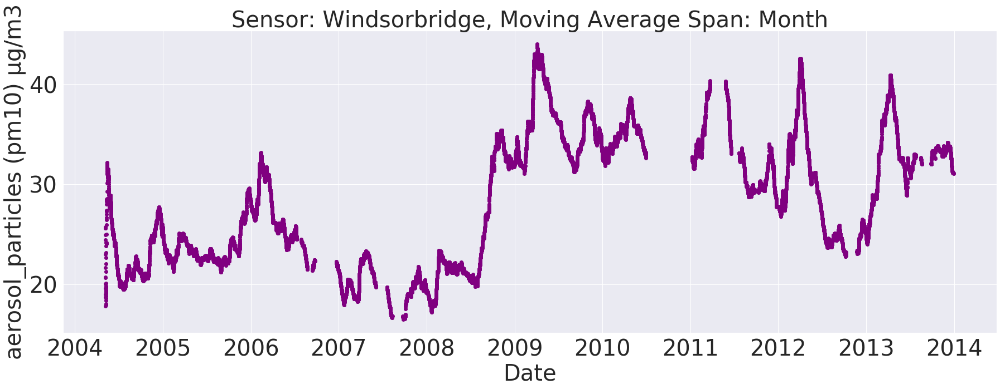

############## londonrdaurn #####################
############## nitrogen_monoxide (NO) ppb #####################


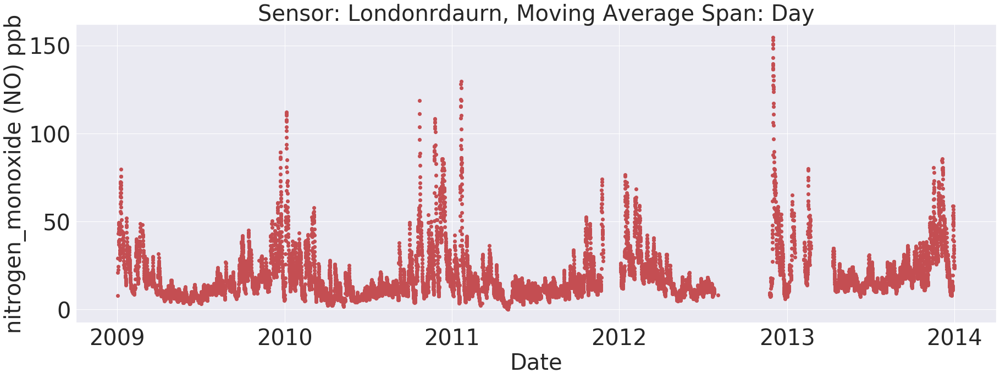

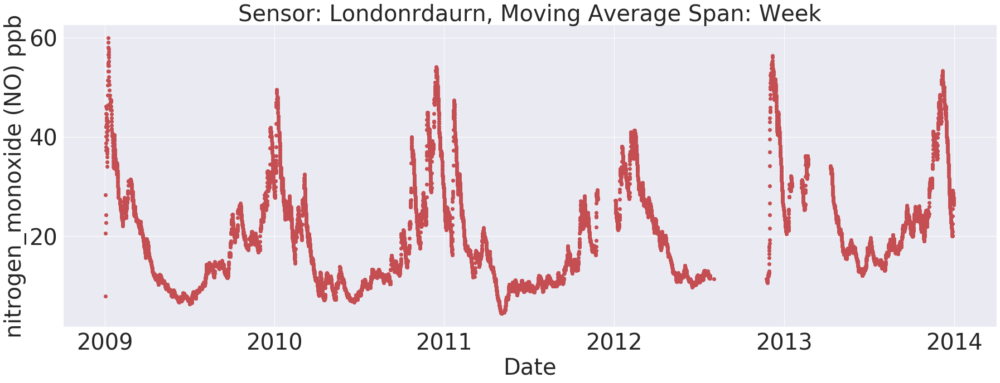

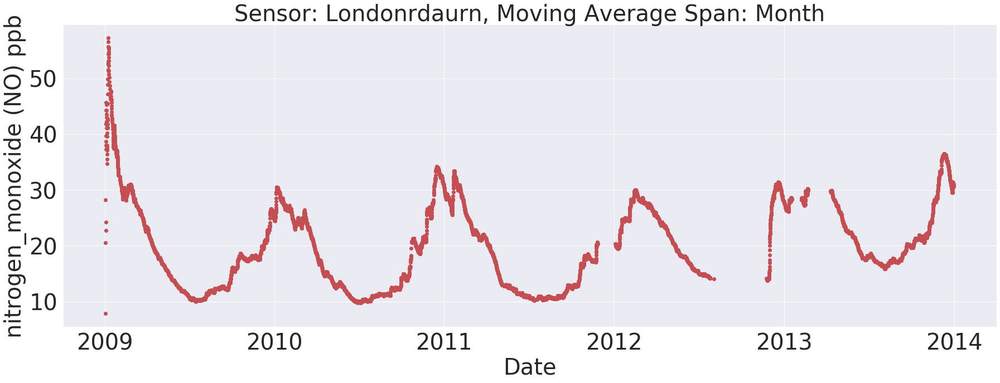

############## nitrogen_dioxide (No2) ppb #####################


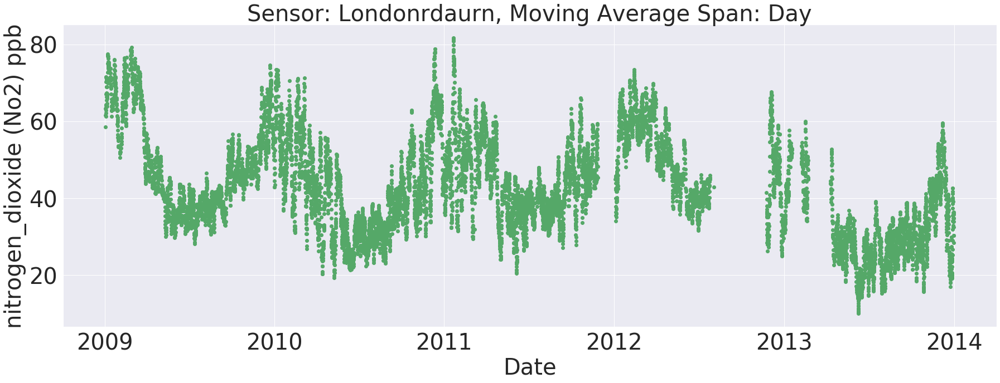

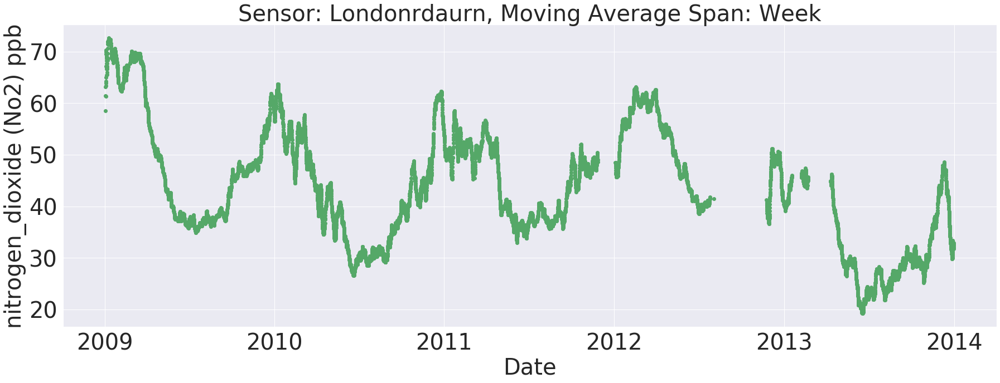

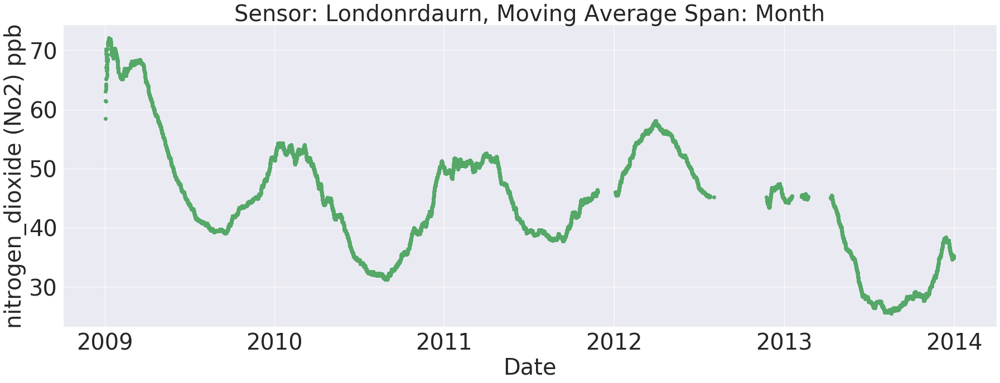

############## carbon_monoxide (CO) ppm #####################
There is no data from sensor at Londonrdaurn for Carbon_monoxide (co) ppm
There is no data from sensor at Londonrdaurn for Carbon_monoxide (co) ppm
There is no data from sensor at Londonrdaurn for Carbon_monoxide (co) ppm
############## aerosol_particles (pm10) µg/m3 #####################


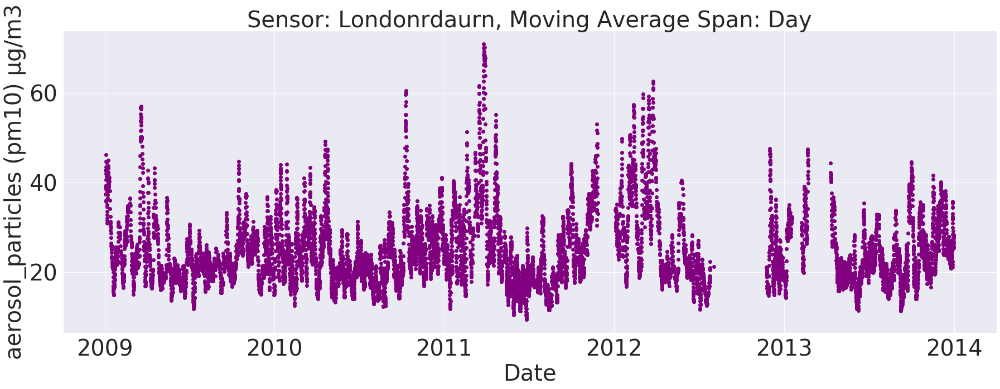

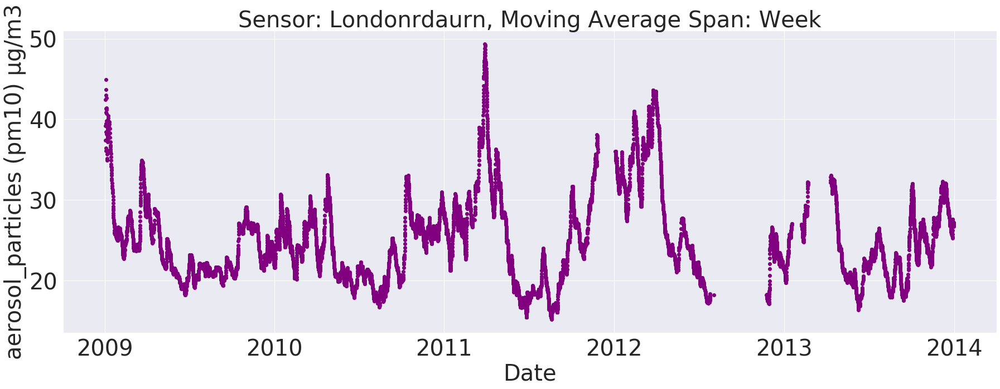

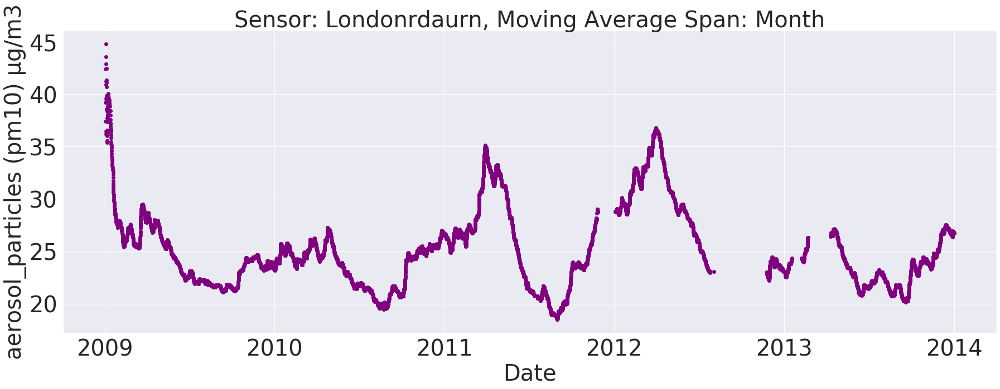

In [87]:
# Plot time series by pollutant by sensor
for sensor in sensors:
    print('############## {} #####################'.format(sensor))
    for i, p in enumerate(pollutants):
        print('############## {} #####################'.format(p))
        for span in spans:
            # Plot from 2001-6 because the first values have really high variance and so screw with axes
            plot_stationarity(df['2001-6':], p, sensor=sensor, save=True, span_size=span, colour=colours[i])

## **LOESS for Seasonal-Trend decomposition**

Cannot really do this on an hourly basis due to the fact that readings are not taken at a consistent frequency even at the same sensor! We need all of the sensors to sync up their time readings or we won't be able to do this

In [112]:
def plot_seasonal_decomp(df, col_name, time, save=True):
    
    # 
    series = df[col_name]
    series = series.resample(time).mean()

    series = series.interpolate(method='time')
    
    if series.isna().sum() >= 0:
        series = series.dropna()

    # Decompose with LOESS
    try:
        decomp = sm.tsa.seasonal_decompose(series, model='additive')
    except ValueError :
        print("{} didn't work with {}".format(col_name, time))
        return
    
    # Plot it 
    plt.figure(figsize=(20, 10))
    plt.plot(decomp.trend, label='trend')
    plt.plot(decomp.seasonal, label='seasonal')
    plt.plot(decomp.resid, label='residual', linestyle='dashed', alpha=0.5)
    plt.plot(decomp.observed, label='observed data', alpha=0.5, marker='*')
    
    # Make it pretty
    times = {'D': 'daily', 'W': 'weekly', 'M': 'monthly'}
    plt.legend()
    plt.title('STL of {} on a {} basis'.format(col_name.split()[0], times[time]))
    plt.xlabel('Date')
    plt.ylabel('Sensor Value')
    
    if save:
        plt.savefig('../graphs/stl_{}_{}'.format(col_name.split()[0], time))
    plt.show()
    
    return decomp

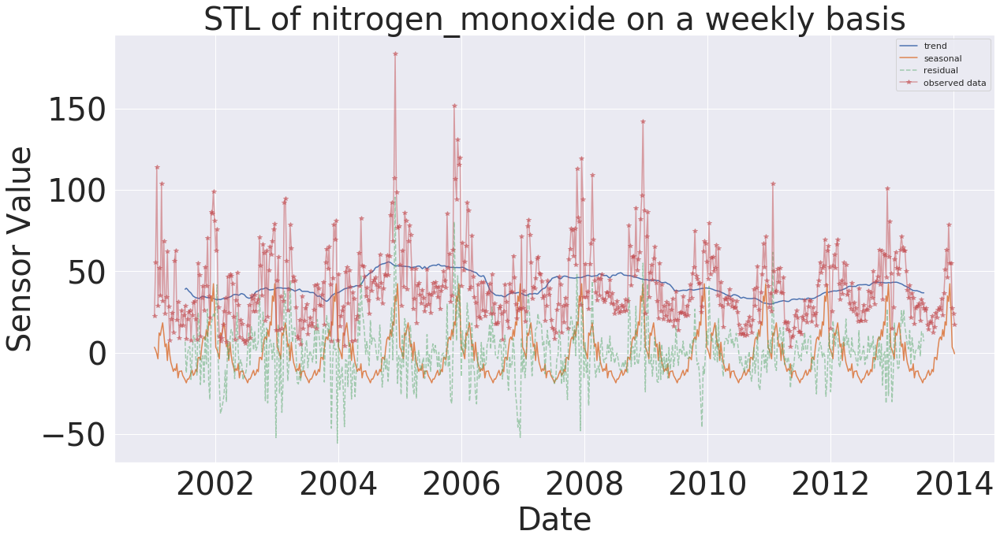

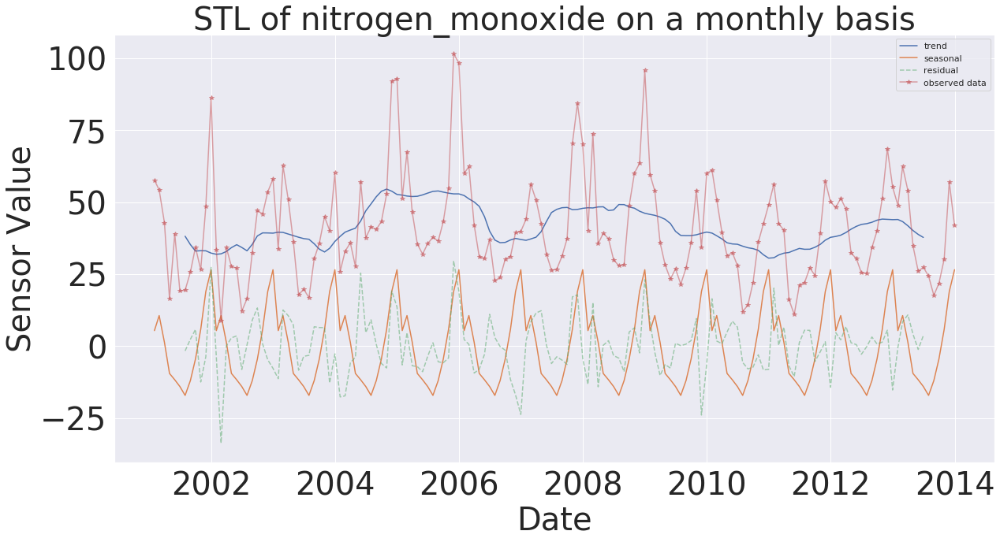

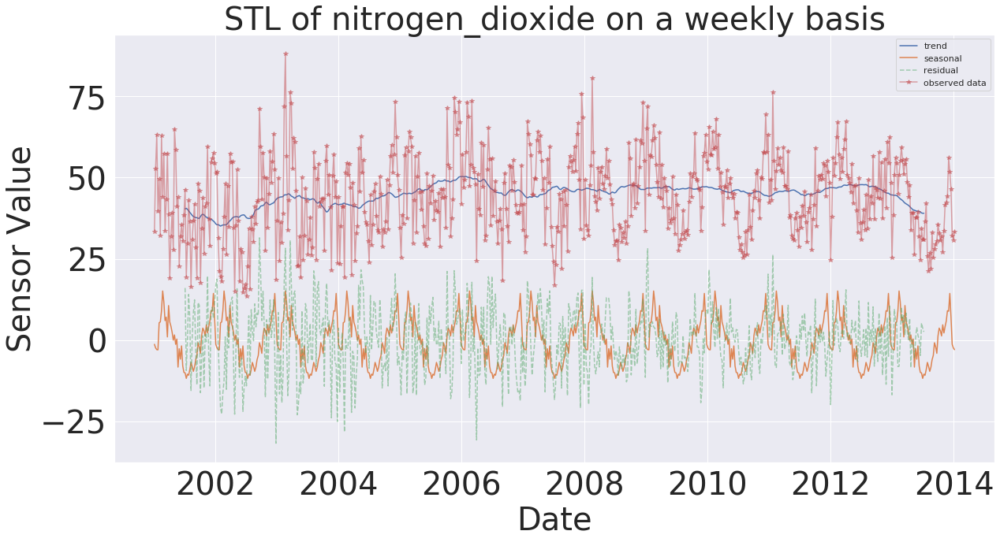

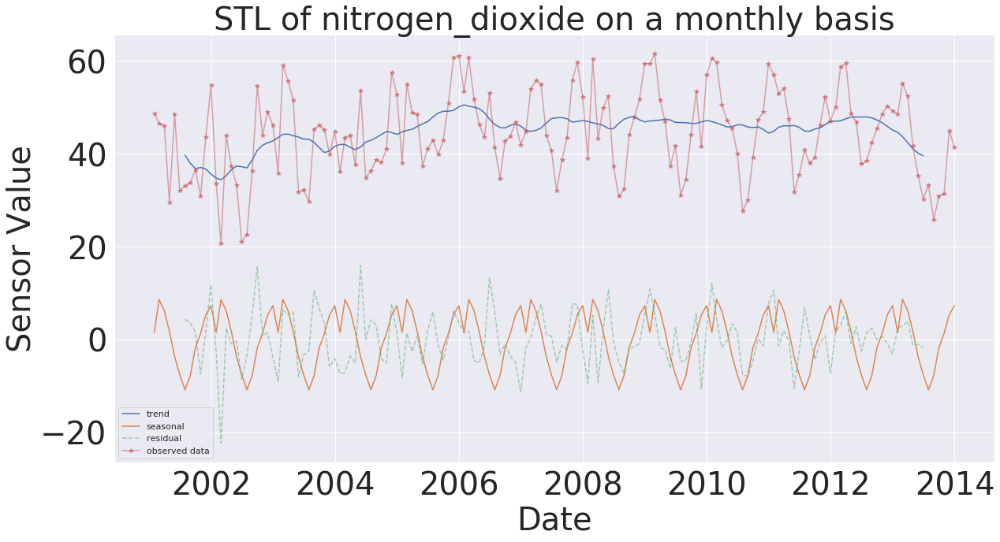

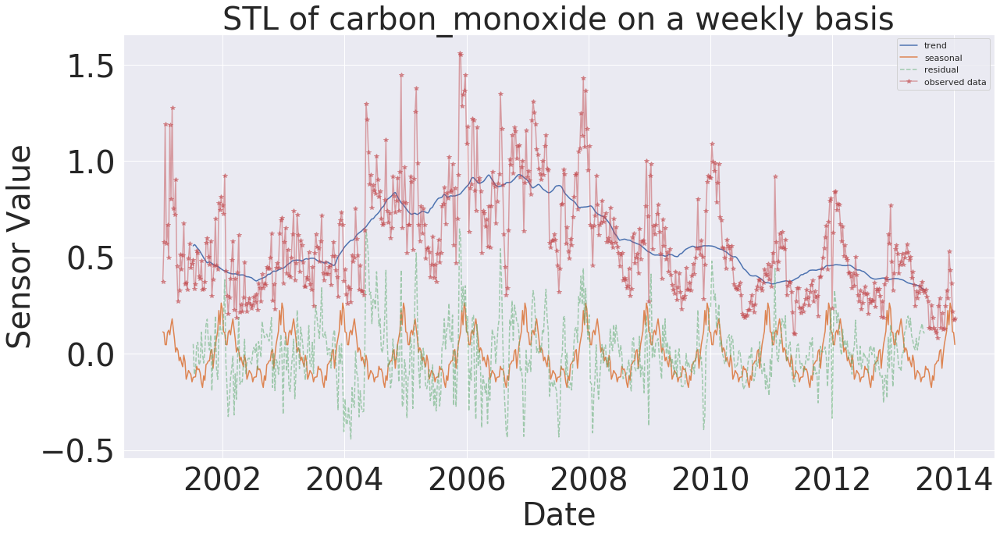

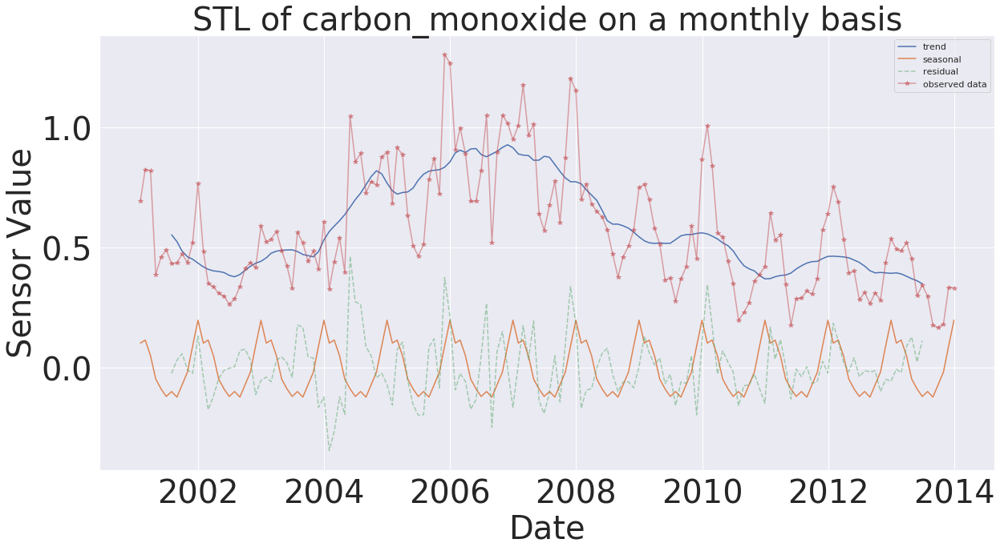

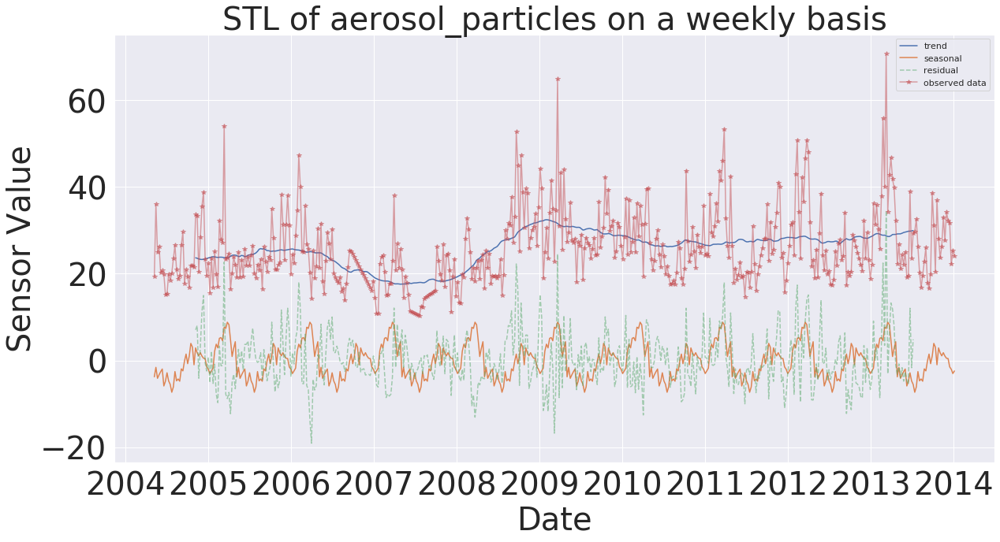

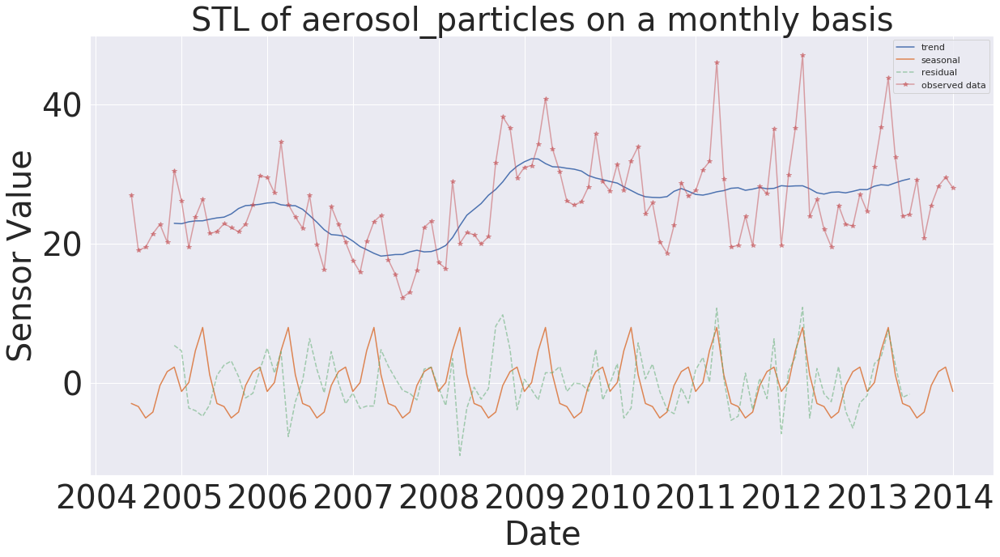

In [114]:
for p in pollutants:
    # Exclude yearly and daily
    for t in periods[2:]:
        plot_seasonal_decomp(df, p, t)

**Trend** 
Shows us the results of implementations of AQ policy 
We can see that nothing has changed really apart from CO which shot up 2005-2007. 

**Seasonal**
Shows a season of a year is present with peak at December/Janu


### **ARIMA** 

In [52]:
import itertools
import warnings
from tqdm import tqdm

In [53]:
def ARIMA(df, col_name, sensor, param, freq, time='D'):
    series = df[df.sensor_location_slug==sensor][col_name]
    
    if series.notna().sum() == 0:
        return None, None, True
    
    
    series = series.resample(time).mean()

    series = series.interpolate(method='time')
    
    if(freq != 'DAY'):
        series = series.resample(freq).mean()
        #series = series.fillna(y.bfill())

    if series.isna().sum() >= 0:
        series = series.dropna()
    
    model = sm.tsa.statespace.SARIMAX(series, order=param[0], seasonal_order=param[1], enforce_stationarity=False, enforce_invertibility=False)

    out = model.fit()
    
    return out, series, False


Pollutant:  nitrogen_monoxide (NO) ppb
Sensor:  guildhall
Frequency:  monthly
MSE of one-step ahead (full history) forecasts is 88.05
MSE of dynamic (uses data up to 2010-01-01) forecasts is 133.97


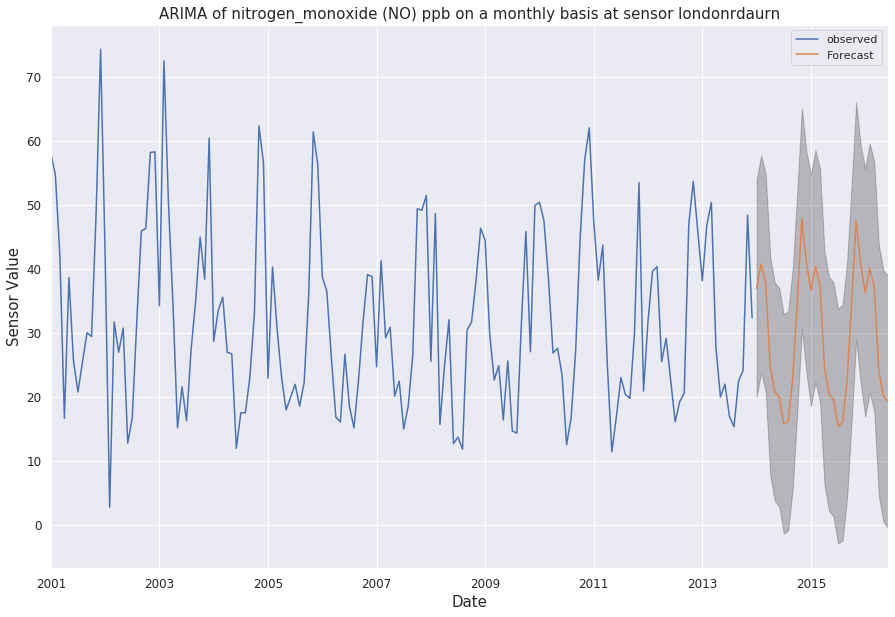


Pollutant:  nitrogen_monoxide (NO) ppb
Sensor:  guildhall
Frequency:  weekly
MSE of one-step ahead (full history) forecasts is 206.23
MSE of dynamic (uses data up to 2010-01-04) forecasts is 311.17


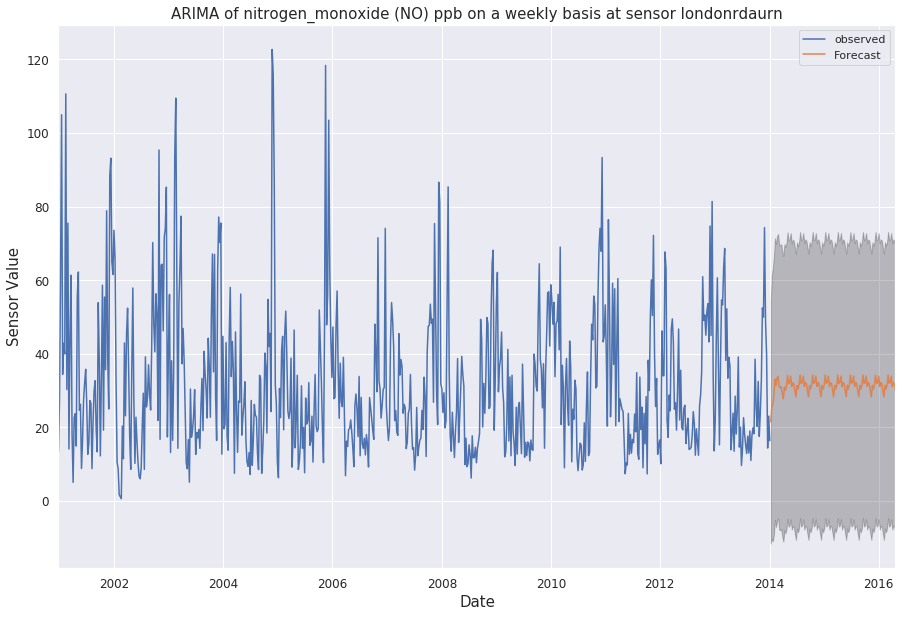


Pollutant:  nitrogen_monoxide (NO) ppb
Sensor:  windsorbridge
Frequency:  monthly
MSE of one-step ahead (full history) forecasts is 441.33
MSE of dynamic (uses data up to 2010-01-01) forecasts is 569.78


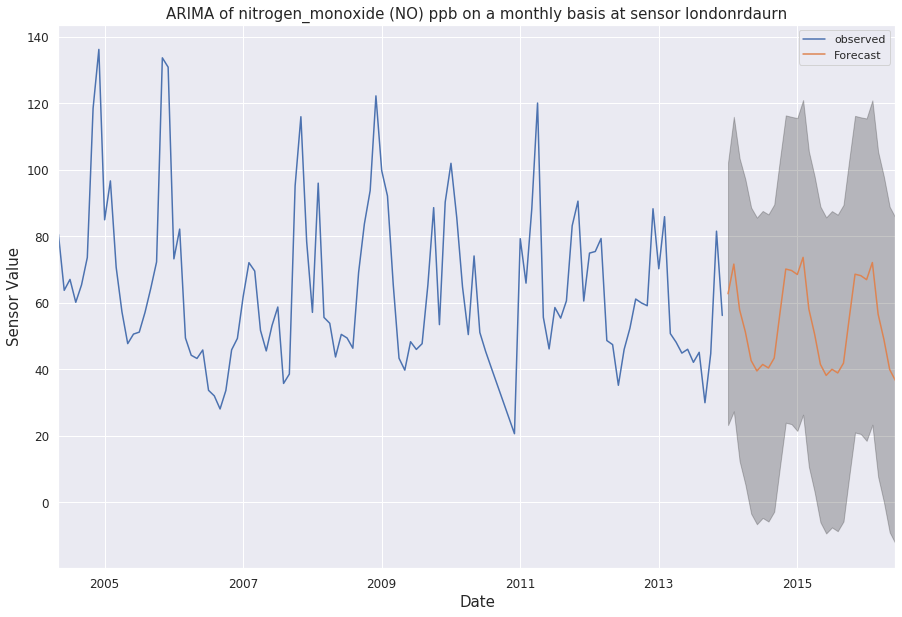


Pollutant:  nitrogen_monoxide (NO) ppb
Sensor:  windsorbridge
Frequency:  weekly
MSE of one-step ahead (full history) forecasts is 584.76
MSE of dynamic (uses data up to 2010-01-04) forecasts is 891.62


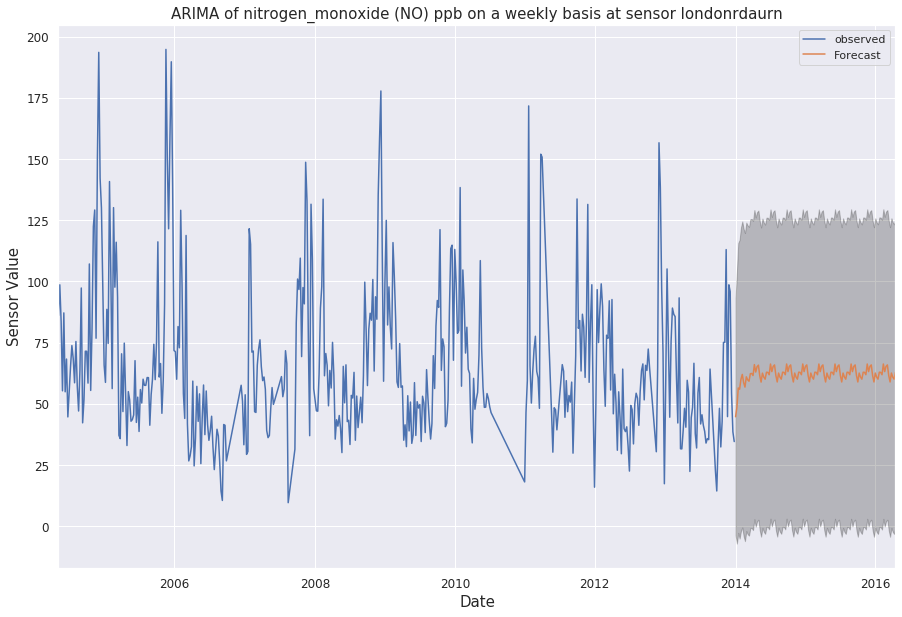


Pollutant:  nitrogen_monoxide (NO) ppb
Sensor:  londonrdaurn
Frequency:  monthly
MSE of one-step ahead (full history) forecasts is 75.71
MSE of dynamic (uses data up to 2010-01-01) forecasts is 2367.79


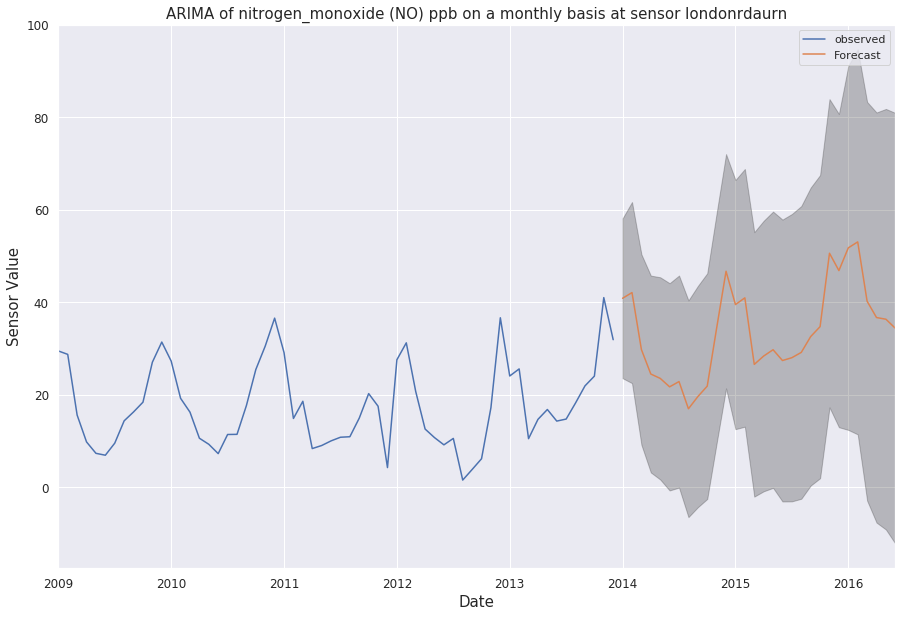


Pollutant:  nitrogen_monoxide (NO) ppb
Sensor:  londonrdaurn
Frequency:  weekly
MSE of one-step ahead (full history) forecasts is 121.13
MSE of dynamic (uses data up to 2010-01-04) forecasts is 177.63


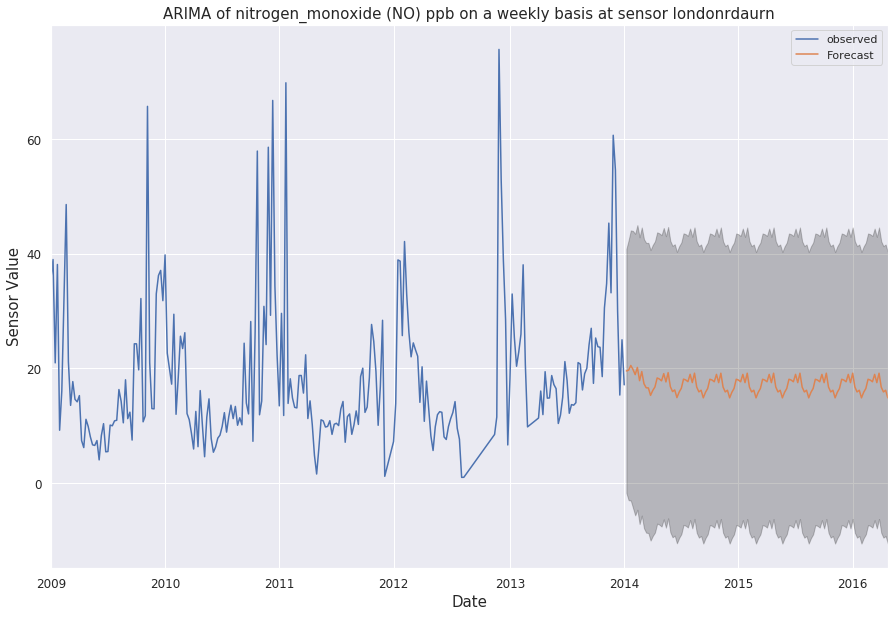


Pollutant:  nitrogen_dioxide (No2) ppb
Sensor:  guildhall
Frequency:  monthly
MSE of one-step ahead (full history) forecasts is 44.81
MSE of dynamic (uses data up to 2010-01-01) forecasts is 50.45


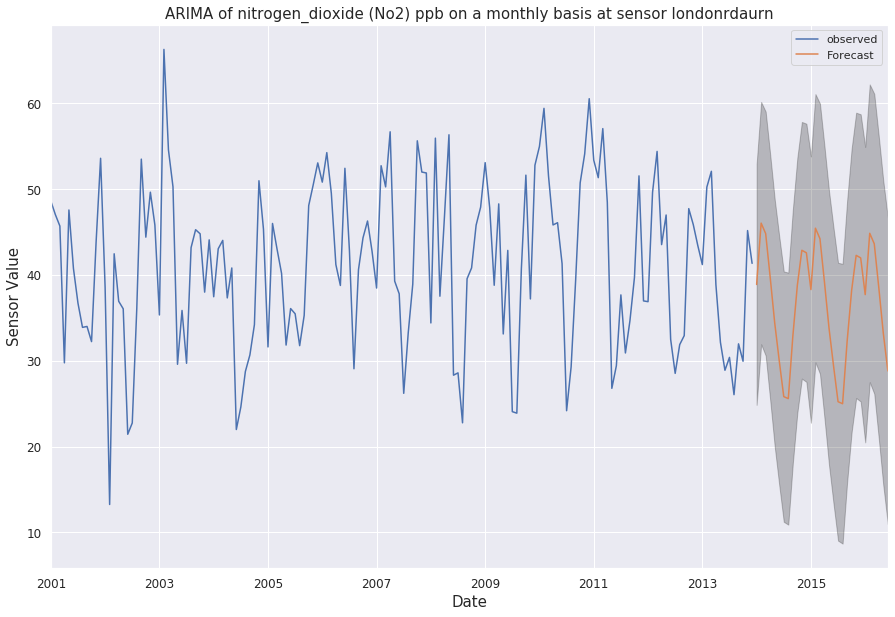


Pollutant:  nitrogen_dioxide (No2) ppb
Sensor:  guildhall
Frequency:  weekly
MSE of one-step ahead (full history) forecasts is 120.04
MSE of dynamic (uses data up to 2010-01-04) forecasts is 173.65


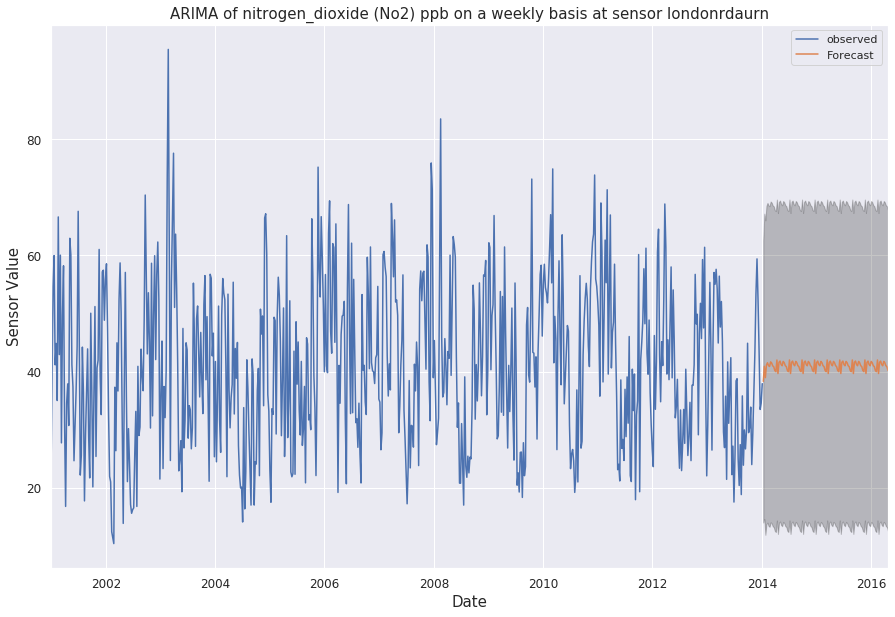


Pollutant:  nitrogen_dioxide (No2) ppb
Sensor:  windsorbridge
Frequency:  monthly
MSE of one-step ahead (full history) forecasts is 64.07
MSE of dynamic (uses data up to 2010-01-01) forecasts is 73.29


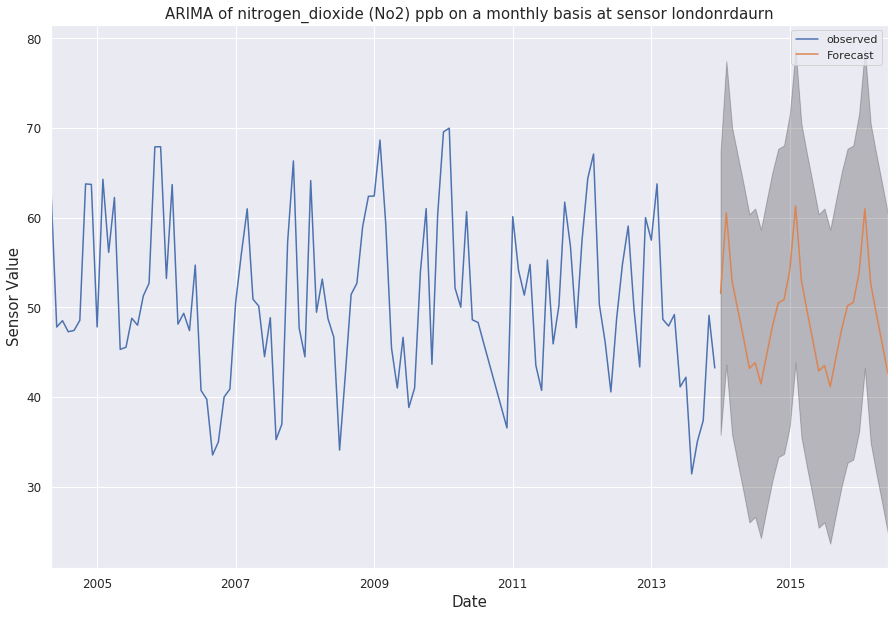


Pollutant:  nitrogen_dioxide (No2) ppb
Sensor:  windsorbridge
Frequency:  weekly
MSE of one-step ahead (full history) forecasts is 111.46
MSE of dynamic (uses data up to 2010-01-04) forecasts is 155.37


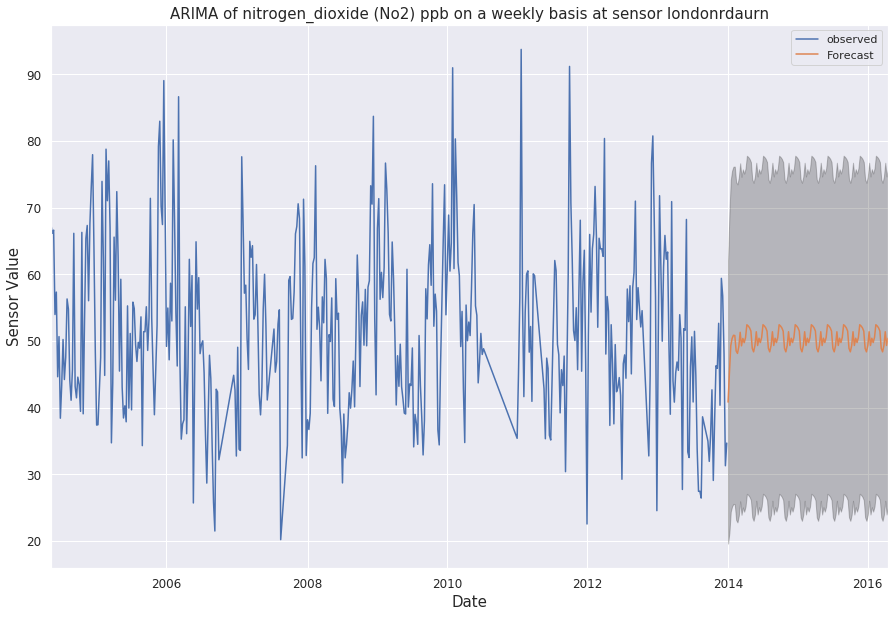


Pollutant:  nitrogen_dioxide (No2) ppb
Sensor:  londonrdaurn
Frequency:  monthly
MSE of one-step ahead (full history) forecasts is 101.44
MSE of dynamic (uses data up to 2010-01-01) forecasts is 9409.5


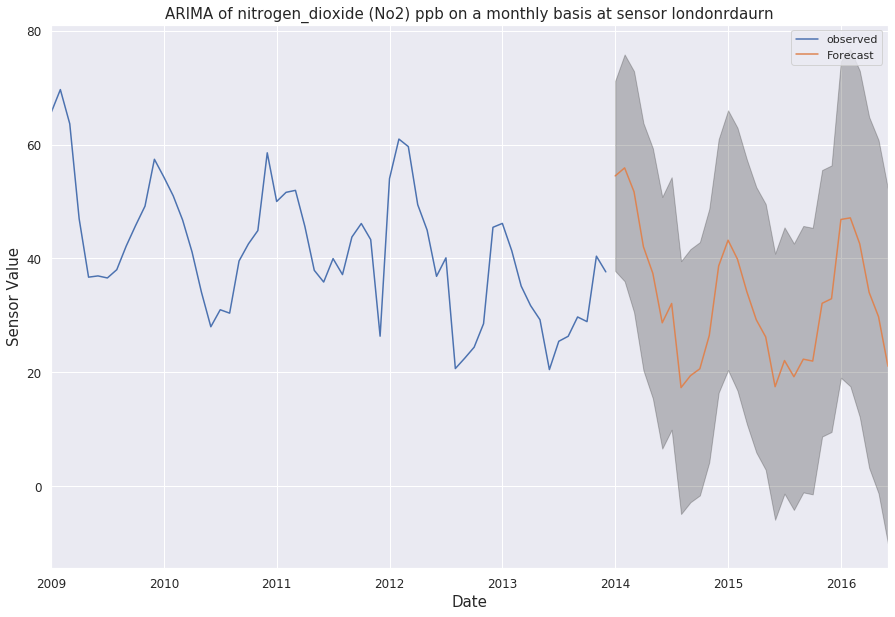


Pollutant:  nitrogen_dioxide (No2) ppb
Sensor:  londonrdaurn
Frequency:  weekly
MSE of one-step ahead (full history) forecasts is 52.67
MSE of dynamic (uses data up to 2010-01-04) forecasts is 191.54


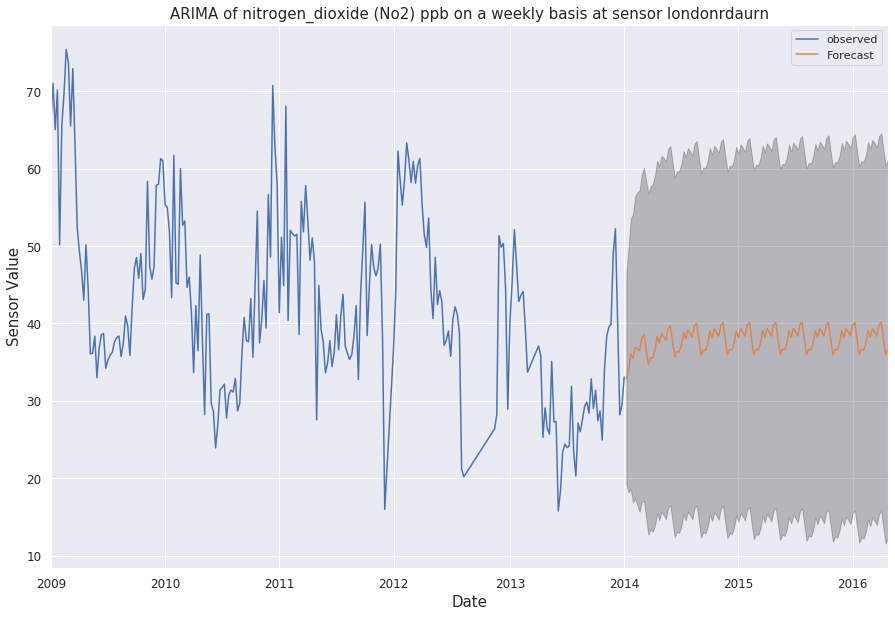


Pollutant:  carbon_monoxide (CO) ppm
Sensor:  guildhall
Frequency:  monthly
MSE of one-step ahead (full history) forecasts is 0.0
MSE of dynamic (uses data up to 2010-01-01) forecasts is 0.01


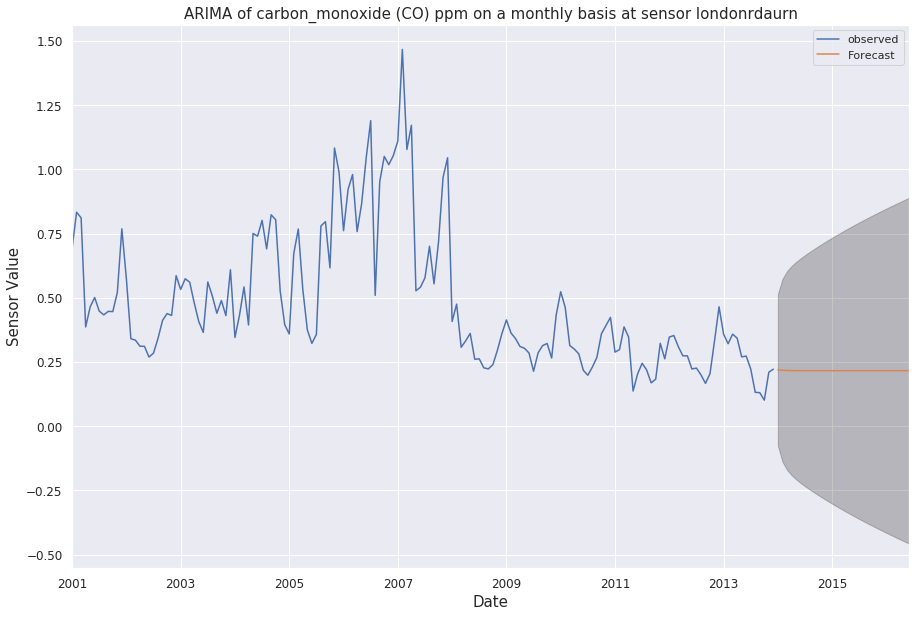


Pollutant:  carbon_monoxide (CO) ppm
Sensor:  guildhall
Frequency:  weekly
MSE of one-step ahead (full history) forecasts is 0.0
MSE of dynamic (uses data up to 2010-01-04) forecasts is 0.02


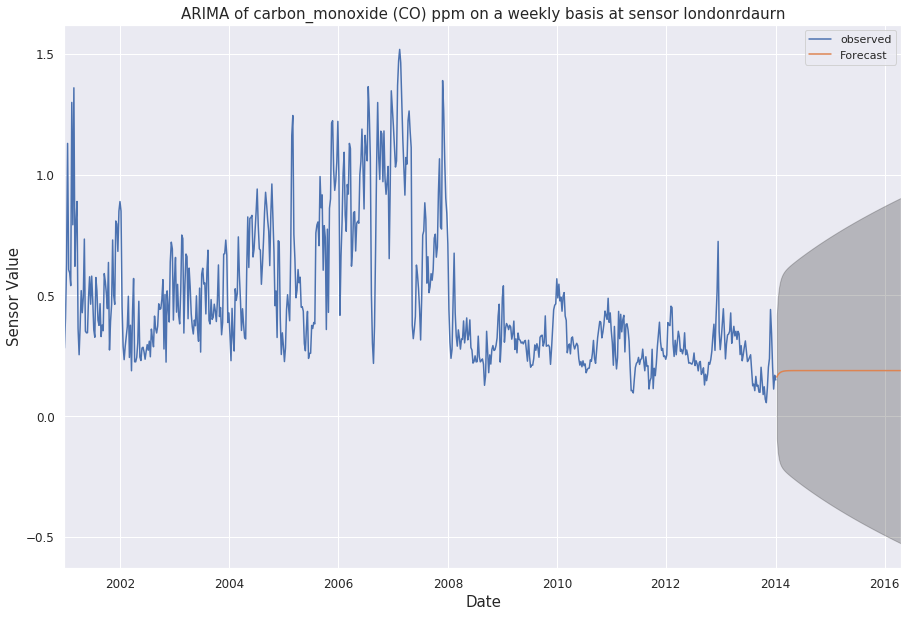


Pollutant:  carbon_monoxide (CO) ppm
Sensor:  windsorbridge
Frequency:  monthly
MSE of one-step ahead (full history) forecasts is 0.03
MSE of dynamic (uses data up to 2010-01-01) forecasts is 0.04


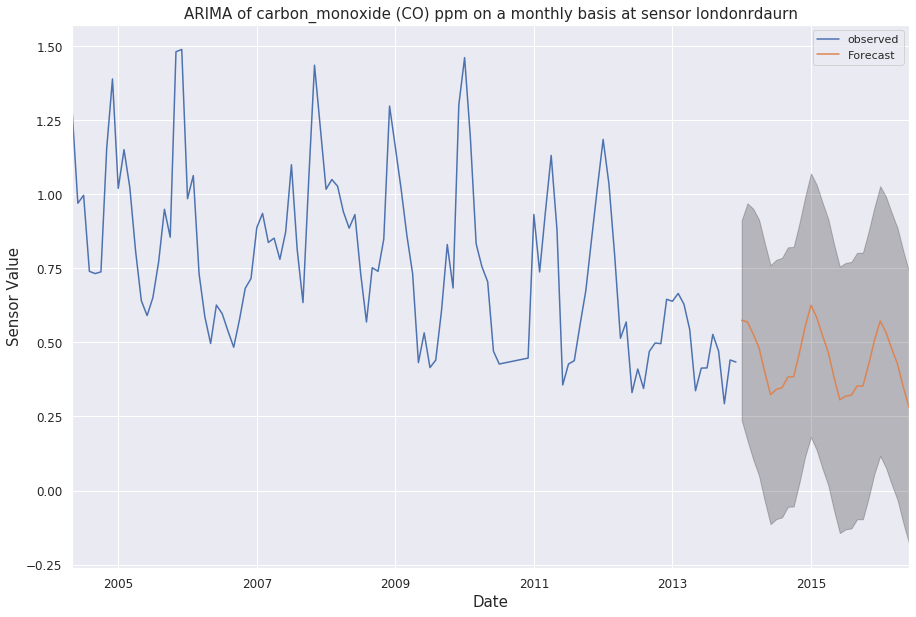


Pollutant:  carbon_monoxide (CO) ppm
Sensor:  windsorbridge
Frequency:  weekly
MSE of one-step ahead (full history) forecasts is 0.02
MSE of dynamic (uses data up to 2010-01-04) forecasts is 0.41


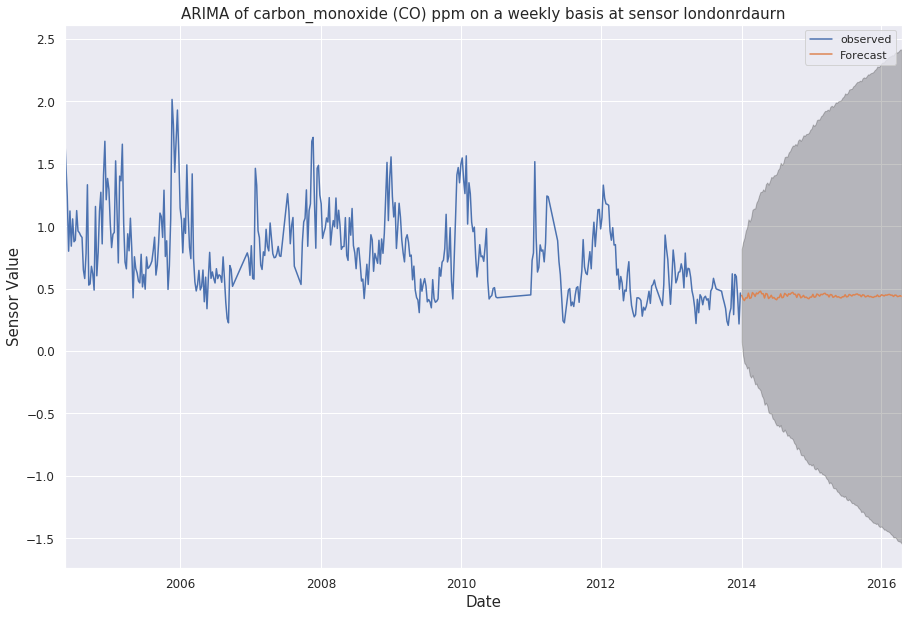


Pollutant:  aerosol_particles (pm10) µg/m3
Sensor:  windsorbridge
Frequency:  monthly
MSE of one-step ahead (full history) forecasts is 51.3
MSE of dynamic (uses data up to 2010-01-01) forecasts is 109.93


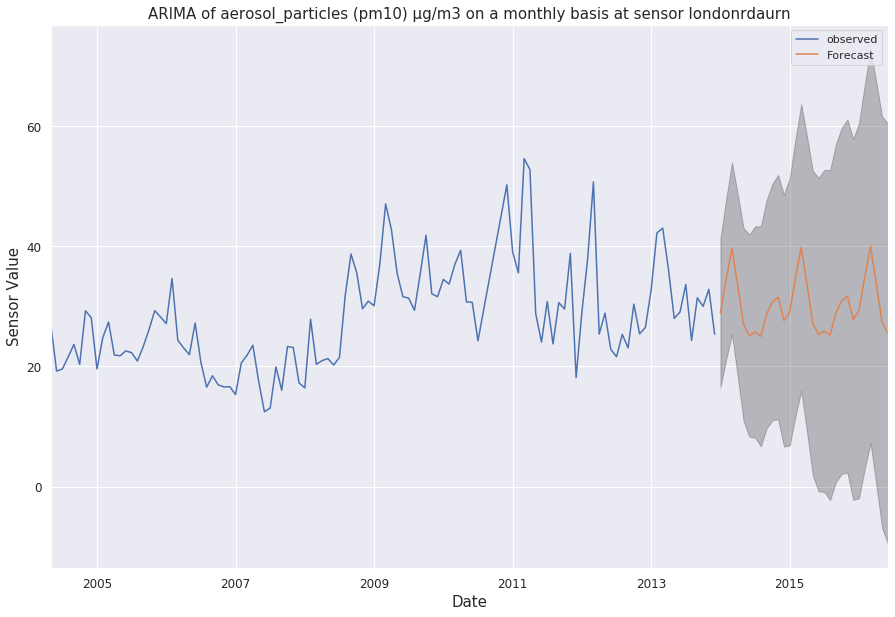


Pollutant:  aerosol_particles (pm10) µg/m3
Sensor:  windsorbridge
Frequency:  weekly
MSE of one-step ahead (full history) forecasts is 58.65
MSE of dynamic (uses data up to 2010-01-04) forecasts is 149.63


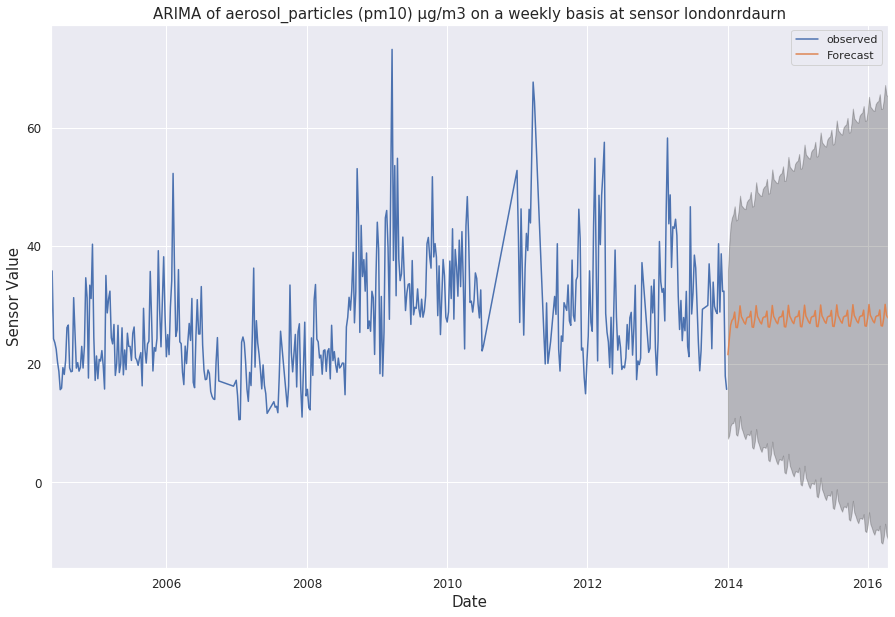


Pollutant:  aerosol_particles (pm10) µg/m3
Sensor:  londonrdaurn
Frequency:  monthly
MSE of one-step ahead (full history) forecasts is 32.34
MSE of dynamic (uses data up to 2010-01-01) forecasts is 608.62


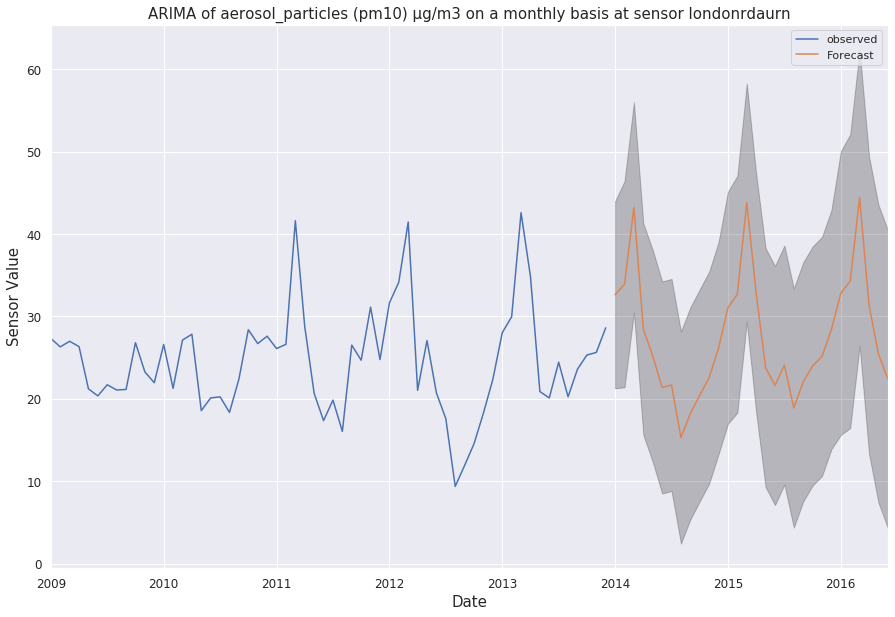


Pollutant:  aerosol_particles (pm10) µg/m3
Sensor:  londonrdaurn
Frequency:  weekly
MSE of one-step ahead (full history) forecasts is 49.64
MSE of dynamic (uses data up to 2010-01-04) forecasts is 83.22


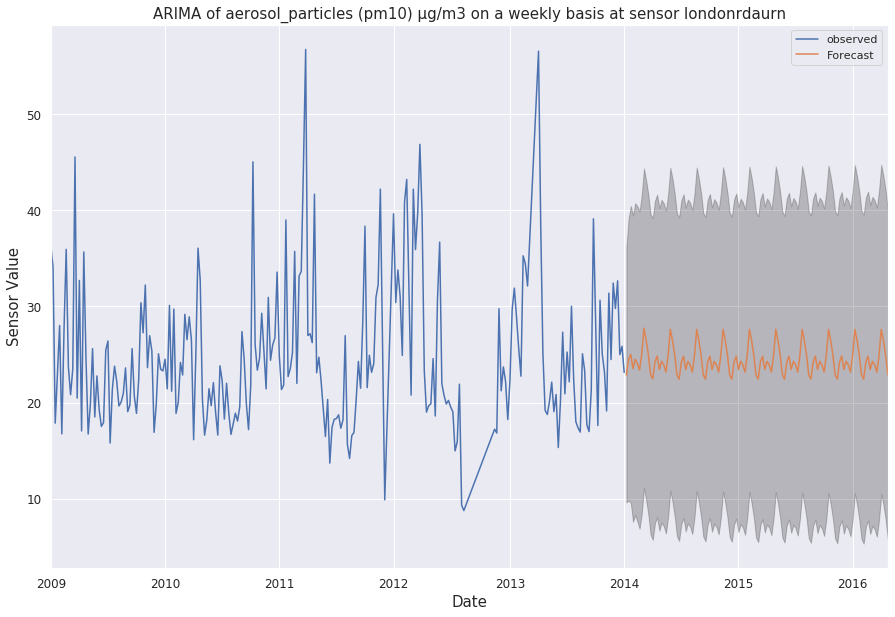

In [54]:
# Ignore warning messages
warnings.filterwarnings("ignore")
pollutants = ['nitrogen_monoxide (NO) ppb', 'nitrogen_dioxide (No2) ppb', 
              'carbon_monoxide (CO) ppm', 'aerosol_particles (pm10) µg/m3']
# Some parameter values 
p, q, d = range(2), range(2), range(2)
 
pqd_vals = list(itertools.product(p, q, d))

seasonal_pqd_vals = list(itertools.product(p, q, d, [12]))

# Grid search over params.
param_combos = list(itertools.product(pqd_vals, seasonal_pqd_vals))

# Arbitrary test date, used as start-point for MSE calculations
# (i.e. at which point does the model start predicting while computing MSE)
testDateWMON = '2010-01-04 00:00:00+00:00'
testDateMS = '2010-01-01 00:00:00+00:00'

# Used for formatting when printing graphs
freqFmt = {'DAY':'daily','MS':'monthly','W-MON':'weekly'}

# How far into the future should the model predict
stepsVal = {'DAY':840,'MS':30,'W-MON':120}

# Plot graphs (t/f)
plots = True

# Dict to hold mse values of Arima and prophet for comparison
perfComp = {}
for x in pollutants:
    perfComp[x] = [{},{}]

# For each pollutant, each sensor and 3 data frequency bins (i.e complexity = 36)
for poll in pollutants:
    for sens in sensors:
        for freq in ['MS','W-MON']:
            
            # Select correct test date
            if(freq == 'W-MON'):
                testDate = testDateWMON
            else:
                testDate = testDateMS

            fits = {}

            # Calculate the AIC for param combinations
            #for p in tqdm(param_combos):
            for p in param_combos:
                fits[p], Y, na = ARIMA(df, poll, sens, p, freq)
                
            if(na == False):

                best_aic = +np.inf
                best_result = None

                # Find model with lowest AIC
                for i in fits:
                    if fits[i].aic < best_aic:
                        best_aic = fits[i].aic
                        best_result = fits[i]    

                # Compute model MSE (full history used when computing predictions)
                pred = best_result.get_prediction(start=pd.to_datetime(testDate), dynamic=False)
                y_forecasted = pred.predicted_mean
                y_truth = Y[testDate:]
                mse = ((y_forecasted - y_truth) ** 2).mean()  
                
                # Add mse to comparison dict
                perfComp[poll][0][sens+': '+freqFmt[freq]] = mse

                # Compute dynamic MSE (limited history used for predictions (tests real predictive potential of model))
                pred_dynamic = best_result.get_prediction(start=pd.to_datetime(testDate), dynamic=True, full_results=True)
                y_forecasted_d = pred_dynamic.predicted_mean
                y_truth_d = Y[testDate:]
                mse_d = ((y_forecasted_d - y_truth_d) ** 2).mean()

                # Print
                print('\n=================================================')
                print('Pollutant: ',poll)
                print('Sensor: ',sens)
                print('Frequency: ',freqFmt[freq])
                print('MSE of one-step ahead (full history) forecasts is {}'.format(round(mse, 2)))
                print('MSE of dynamic (uses data up to '+ str(testDate[0:10]) +') forecasts is {}'.format(round(mse_d, 2)))            

                if(plots == True):

                    # Get forecast of x steps ahead in future
                    pred_uc = best_result.get_forecast(steps=stepsVal[freq])

                    # Get confidence intervals of forecasts
                    pred_ci = pred_uc.conf_int()

                    # Plot
                    ax = Y.plot(label='observed', figsize=(15, 10))
                    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
                    ax.fill_between(pred_ci.index,pred_ci.iloc[:, 0],pred_ci.iloc[:, 1], color='k', alpha=.25)
                    ax.set_xlabel('Date')
                    ax.set_ylabel('Sensor Value')
                    plt.title('ARIMA of {} on a {} basis at sensor {}'.format(poll, freqFmt[freq], sensor))                

                    plt.legend()
                    plt.show() 
            else:
                perfComp[poll][0][sens+': '+freqFmt[freq]] = 'N\A'


* Went for a blunderbuss approach i.e. generated time series for every sensor, every pollutant and 2x period data bins (weekly, monthly) for each. Many of the charts are useless, but we couldn't really know which before doing the analysis so here we go. 

* It seems that ARIMA doesn't deal well with daily data so it was dropped (can add it simply if required by adding string 'DAY' to the 'freq' for loop)

* Performance is better on weekly data bins and best on monthly (from what I hear, ARIMA is best suited for monthly so that would explain the poor performance on the other two)

* Only carbon_monoxide (CO) outputs lowest MSE but thats likely due to data being unnormalised and CO values generally being less than 1

### **PROPHET**

In [31]:
from fbprophet import Prophet
from sklearn.metrics import mean_squared_error

ModuleNotFoundError: No module named 'fbprophet'

In [ ]:
def PROPHET(df_p, freqFmt, col_name, sensor, freq, predict_range, uncertainty_interval):
    
    s = df[df.sensor_location_slug==sensor][col_name]

    # Resample
    if(freq != 'D'):
        s = s.resample(freq).mean() 
    
    # Reset datetime indexing (prophet requires specifically named columns for datetime and vals)
    s = s.reset_index(drop=False)
    s['datetime'] = s['datetime'].astype(str).str[:-15]
    
    # Rename columns according to prophet's specs
    s = s.rename(columns={'datetime': 'ds', col_name: 'y'})
    
    s = s.dropna()
    
    if(s.shape[0] <= 2):
        return 'N\A'
        
    # Create model
    my_model = Prophet(interval_width=uncertainty_interval) 
    my_model.fit(s)  
    
    # Generate dates in the future for which prophet will predict values
    future_dates = my_model.make_future_dataframe(periods=predict_range, freq=freq)
    future_dates.tail()  
    
    # Predict
    forecast = my_model.predict(future_dates)
    forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
    
    # Plot predictions
    #my_model.plot(forecast,uncertainty=True)
    fig = my_model.plot(forecast, xlabel='Date', ylabel='Value', figsize=(15,10))
    ax = fig.gca()
    ax.set_title(('PROPHET of: {} on a {} basis at sensor: {}'.format(col_name, freqFmt[freq], sensor)), size=16)
    ax.set_xlabel("Date", size=16)
    ax.set_ylabel("Sensor Value", size=16)

    # Plot trends
    my_model.plot_components(forecast) 

    # Calculate mse
    metric_df = forecast.set_index('ds')[['yhat']].join(s.set_index('ds').y).reset_index()
    metric_df.tail()
    metric_df.dropna(inplace=True)
    metric_df.tail()
    mse = mean_squared_error(metric_df.y, metric_df.yhat)
    return mse

In [ ]:

# Used for formatting when printing graphs
freqFmt = {'D':'daily','MS':'monthly','W-MON':'weekly'}

# How far into the future should the model predict
stepsVal = {'D':1600,'MS':100,'W-MON':400}

for poll in pollutants:
    for sens in sensors:
        for freq in ['MS','W-MON']:
            
            mse = PROPHET(df, freqFmt, poll, sens, freq, predict_range=stepsVal[freq], uncertainty_interval=0.95)
            perfComp[poll][1][sens+': '+freqFmt[freq]] = mse

Charts Info:
    * First chart: Predictions
    * Second chart: Trend over the years e.g. whether Co2 generally decreases/increases etc.
    * Third chart: Trend over months in a year
    
    * Black dots = observed data
    * Blue line = predictions
    * Blue area = confidence interval (95%)
    
    
* MSE values generally better than ARIMA, although not much difference
* Forcasting is significantly better 
* Best performance for CO again. Seems that the other data are difficult to forcast, although PROPHET still does a good job on it
    

# ARIMA vs PROPHET

In [ ]:
# Compare the MSE of both time series methods
for poll in perfComp:
    print('\n===================================================================')
    print('Pollutant: ' +poll)
    sw = False
    for item in perfComp[poll]:
        printing = 0
        if(sw == False):
            print('\t ARIMA:')
            sw = True
        else:
            print('\t PROPHET:')
        for reading in item:
            # Need this as the funtion prints out the last row again for some reason
            if(printing < 6):
                print('\t\t ' + str(reading) + ' MSE = ' + str(item[reading]))
            printing += 1


* Prophet generally better + it has way better forecasts.
* CO for both performs pretty well.